In [1]:
library(scRepertoire)

Loading required package: ggplot2



In [2]:
FT1 <- read.csv("/node200data/FTC/data/cellranger_multi_outs/FT1/outs/per_sample_outs/FT1/vdj_t/filtered_contig_annotations.csv")
FT2 <- read.csv("/node200data/FTC/data/cellranger_multi_outs/FT2/outs/per_sample_outs/FT2/vdj_t/filtered_contig_annotations.csv")
FT3 <- read.csv("/node200data/FTC/data/cellranger_multi_outs/FT3/outs/per_sample_outs/FT3/vdj_t/filtered_contig_annotations.csv")
FT4 <- read.csv("/node200data/FTC/data/cellranger_multi_outs/FT4/outs/per_sample_outs/FT4/vdj_t/filtered_contig_annotations.csv")
FT5 <- read.csv("/node200data/FTC/data/cellranger_multi_outs/FT5/outs/per_sample_outs/FT5/vdj_t/filtered_contig_annotations.csv")
N1 <- read.csv("/home/jurny0402/TCR_explore/public_dataset/GSE218743/2after_cellranger/VDJ/after_cellranger_SRR22408351/outs/filtered_contig_annotations.csv")
N2 <- read.csv("/home/jurny0402/TCR_explore/public_dataset/GSE218743/2after_cellranger/VDJ/after_cellranger_SRR22408352/outs/filtered_contig_annotations.csv")

contig_list <- list(FT1,FT2,FT3,FT4,FT5,N1,N2)

In [60]:
head(contig_list[[1]])

,barcode,is_cell,contig_id,high_confidence,length,chain,v_gene,d_gene,j_gene,c_gene,⋯,fwr3_nt,cdr3,cdr3_nt,fwr4,fwr4_nt,reads,umis,raw_clonotype_id,raw_consensus_id,exact_subclonotype_id
,<chr>,<chr>,<chr>,<chr>,<int>,<chr>,<chr>,<chr>,<chr>,<chr>,⋯,<chr>,<chr>,<chr>,<chr>,<chr>,<int>,<int>,<chr>,<chr>,<int>
1,AAACCTGCACCGGAAA-1,true,AAACCTGCACCGGAAA-1_contig_1,true,485,TRB,TRBV24-1,,TRBJ1-5,TRBC1,⋯,ATAAACAAAGGAGAGATCTCTGATGGATACAGTGTCTCTCGACAGGCACAGGCTAAATTCTCCCTGTCCCTAGAGTCTGCCATCCCCAACCAGACAGCTCTTTACTTC,CATSDKYLNQPQHF,TGTGCCACCAGTGATAAATACCTCAATCAGCCCCAGCATTTT,GDGTRLSIL,GGTGATGGGACTCGACTCTCCATCCTAG,1673,3,clonotype34,clonotype34_consensus_1,1
2,AAACCTGCACCGGAAA-1,true,AAACCTGCACCGGAAA-1_contig_2,true,517,TRA,TRAV29/DV5,,TRAJ44,TRAC,⋯,AATGAAGATGGAAGATTCACTGTCTTCTTAAACAAAAGTGCCAAGCACCTCTCTCTGCACATTGTGCCCTCCCAGCCTGGAGACTCTGCAGTGTACTTC,CAAIRYTGTASKLTF,TGTGCAGCAATCCGCTATACCGGCACTGCCAGTAAACTCACCTTT,GTGTRLQVTL,GGGACTGGAACAAGACTTCAGGTCACGCTCG,1851,2,clonotype34,clonotype34_consensus_2,1
3,AAACCTGGTACTCAAC-1,true,AAACCTGGTACTCAAC-1_contig_1,true,667,TRA,TRAV8-2,,TRAJ22,TRAC,⋯,AAAGGCATCAACGGTTTTGAGGCTGAATTTAAGAAGAGTGAAACCTCCTTCCACCTGACGAAACCCTCAGCCCATATGAGCGACGCGGCTGAGTACTTC,CVVSEGGSARQLTF,TGTGTTGTGAGTGAGGGTGGTTCTGCAAGGCAACTGACCTTT,GSGTQLTVLP,GGATCTGGGACACAATTGACTGTTTTACCTG,935,3,clonotype35,clonotype35_consensus_3,4
4,AAACCTGGTCTCTTAT-1,true,AAACCTGGTCTCTTAT-1_contig_1,true,484,TRB,TRBV4-2,,TRBJ2-7,TRBC2,⋯,ACTGAAAACAACAGTGTGCCAAGTCGCTTCTCACCTGAATGCCCCAACAGCTCTCACTTATTCCTTCACCTACACACCCTGCAGCCAGAAGACTCGGCCCTGTATCTC,CASSQEIKRELIEQYF,TGTGCCAGCAGCCAAGAAATAAAACGGGAGTTGATCGAGCAGTACTTC,GPGTRLTVT,GGGCCGGGCACCAGGCTCACGGTCACAG,2990,4,clonotype1089,clonotype1089_consensus_2,1
5,AAACCTGGTCTCTTAT-1,true,AAACCTGGTCTCTTAT-1_contig_2,true,506,TRA,TRAV17,,TRAJ40,TRAC,⋯,AAACACAGTGGAAGATTAAGAGTCACGCTTGACACTTCCAAGAAAAGCAGTTCCTTGTTGATCACGGCTTCCCGGGCAGCAGACACTGCTTCTTACTTC,CATDAPSGTYKYIF,TGTGCTACGGACGCTCCCTCAGGAACCTACAAATACATCTTT,GTGTRLKVLA,GGAACAGGCACCAGGCTGAAGGTTTTAGCAA,2888,6,clonotype1089,clonotype1089_consensus_3,1
6,AAACCTGGTCTCTTAT-1,true,AAACCTGGTCTCTTAT-1_contig_3,true,514,TRB,TRBV11-2,TRBD1,TRBJ2-1,TRBC2,⋯,GTGGATGATTCACAGTTGCCTAAGGATCGATTTTCTGCAGAGAGGCTCAAAGGAGTAGACTCCACTCTCAAGATCCAGCCTGCAAAGCTTGAGGACTCGGCCGTGTATCTC,CASRDRQGANEQFF,TGTGCCAGCAGGGACCGACAGGGGGCTAATGAGCAGTTCTTC,GPGTRLTVL,GGGCCAGGGACACGGCTCACCGTGCTAG,5193,10,clonotype1089,clonotype1089_consensus_1,1


In [55]:
data(contig_list)

In [3]:
combined <- combineTCR(contig_list,
                      samples = c("FT1","FT2","FT3","FT4","FT5","N1","N2"),
                      cells = "T-AB",
                      ID = c("a","a","a","c","c","n","n"),
                      removeNA = T,
                      removeMulti = T)

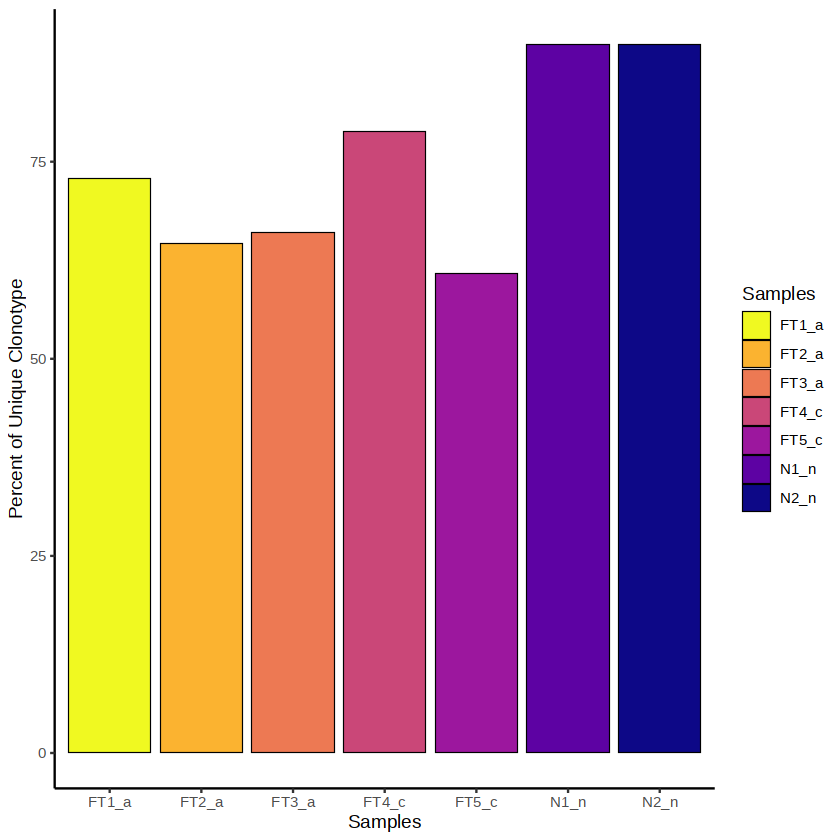

In [53]:
quantContig(combined,
           cloneCall = "strict",
           chain = c("both"),
           scale = T)

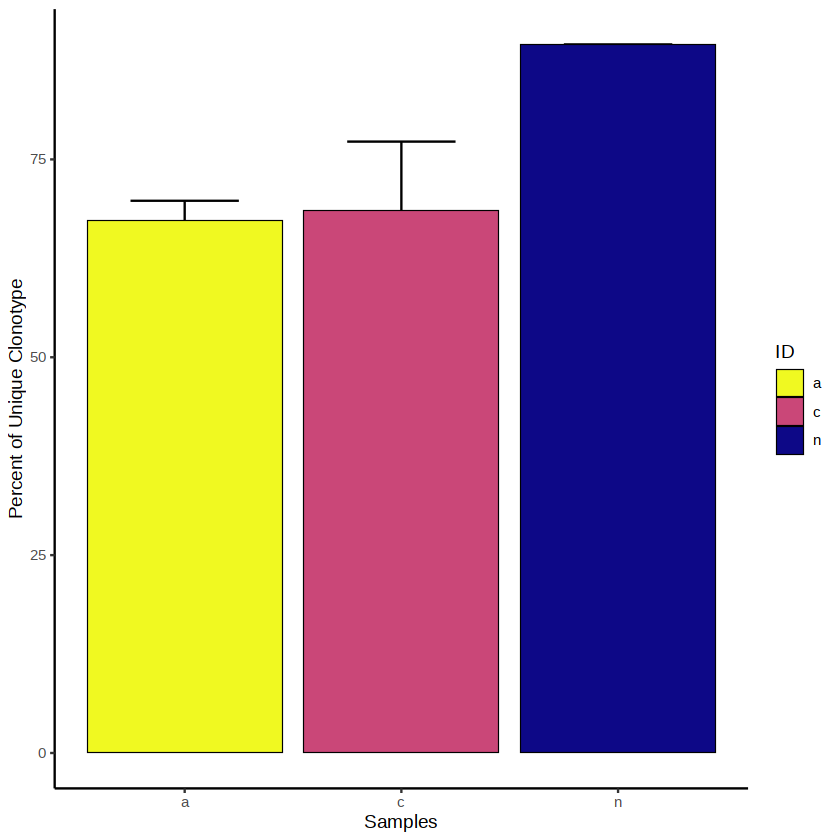

In [7]:
quantContig(combined, 
            cloneCall="gene", 
            group.by = "ID", 
            scale = TRUE)

Warning message:
“The dot-dot notation (`..scaled..`) was deprecated in ggplot2 3.4.0.
ℹ Please use `after_stat(scaled)` instead.
ℹ The deprecated feature was likely used in the scRepertoire package.
  Please report the issue to the authors.”


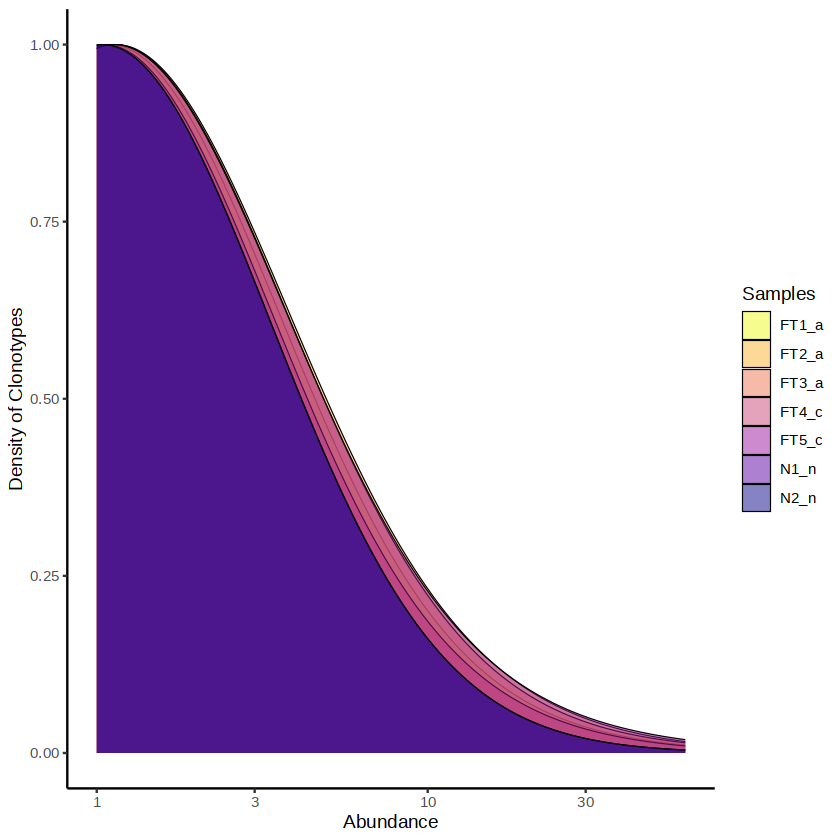

In [8]:
abundanceContig(combined, 
                cloneCall = "gene", 
                scale = TRUE)

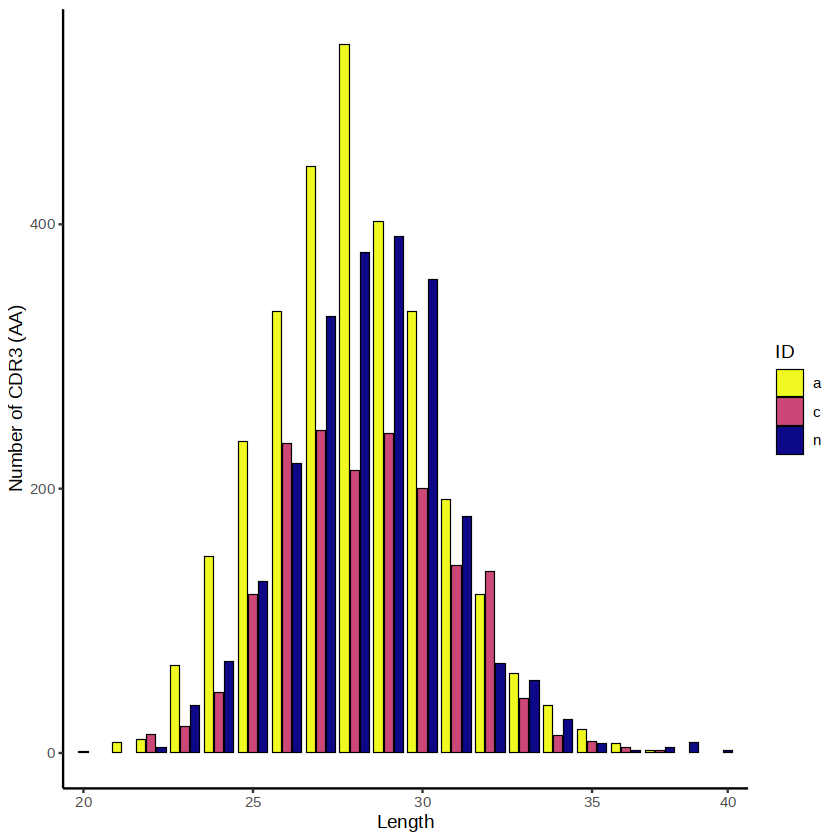

In [6]:
lengthContig(combined[-4], 
             cloneCall = "aa",
             group.by = "ID",
             chain = "both") 

In [34]:
combinednor <- list(combined[[6]],combined[[7]])

In [38]:
combined

barcode,sample,ID,TCR1,cdr3_aa1,cdr3_nt1,TCR2,cdr3_aa2,cdr3_nt2,CTgene,CTnt,CTaa,CTstrict,cellType
<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>
FT1_a_AAACCTGCACCGGAAA-1,FT1,a,TRAV29/DV5.TRAJ44.TRAC,CAAIRYTGTASKLTF,TGTGCAGCAATCCGCTATACCGGCACTGCCAGTAAACTCACCTTT,TRBV24-1.NA.TRBJ1-5.TRBC1,CATSDKYLNQPQHF,TGTGCCACCAGTGATAAATACCTCAATCAGCCCCAGCATTTT,TRAV29/DV5.TRAJ44.TRAC_TRBV24-1.NA.TRBJ1-5.TRBC1,TGTGCAGCAATCCGCTATACCGGCACTGCCAGTAAACTCACCTTT_TGTGCCACCAGTGATAAATACCTCAATCAGCCCCAGCATTTT,CAAIRYTGTASKLTF_CATSDKYLNQPQHF,TRAV29/DV5.TRAJ44.TRAC_TGTGCAGCAATCCGCTATACCGGCACTGCCAGTAAACTCACCTTT_TRBV24-1.NA.TRBJ1-5.TRBC1_TGTGCCACCAGTGATAAATACCTCAATCAGCCCCAGCATTTT,T-AB
FT1_a_AAACCTGGTCTTGTCC-1,FT1,a,TRAV30.TRAJ23.TRAC,CGTEIYNQGGKLIF,TGCGGCACAGAGATCTATAACCAGGGAGGAAAGCTTATCTTC,TRBV12-3.NA.TRBJ1-2.TRBC1,CASSVGPQVGNYGYTF,TGTGCCAGCAGCGTGGGACCCCAGGTCGGGAACTATGGCTACACCTTC,TRAV30.TRAJ23.TRAC_TRBV12-3.NA.TRBJ1-2.TRBC1,TGCGGCACAGAGATCTATAACCAGGGAGGAAAGCTTATCTTC_TGTGCCAGCAGCGTGGGACCCCAGGTCGGGAACTATGGCTACACCTTC,CGTEIYNQGGKLIF_CASSVGPQVGNYGYTF,TRAV30.TRAJ23.TRAC_TGCGGCACAGAGATCTATAACCAGGGAGGAAAGCTTATCTTC_TRBV12-3.NA.TRBJ1-2.TRBC1_TGTGCCAGCAGCGTGGGACCCCAGGTCGGGAACTATGGCTACACCTTC,T-AB
FT1_a_AAACCTGTCTACGAGT-1,FT1,a,TRAV19.TRAJ53.TRAC,CALRRSGGSNYKLTF,TGTGCTCTGAGAAGAAGTGGAGGTAGCAACTATAAACTGACATTT,TRBV29-1.NA.TRBJ2-5.TRBC2,CSVEGGLSSGTQYF,TGCAGCGTTGAAGGGGGCCTGAGTTCCGGGACCCAGTACTTC,TRAV19.TRAJ53.TRAC_TRBV29-1.NA.TRBJ2-5.TRBC2,TGTGCTCTGAGAAGAAGTGGAGGTAGCAACTATAAACTGACATTT_TGCAGCGTTGAAGGGGGCCTGAGTTCCGGGACCCAGTACTTC,CALRRSGGSNYKLTF_CSVEGGLSSGTQYF,TRAV19.TRAJ53.TRAC_TGTGCTCTGAGAAGAAGTGGAGGTAGCAACTATAAACTGACATTT_TRBV29-1.NA.TRBJ2-5.TRBC2_TGCAGCGTTGAAGGGGGCCTGAGTTCCGGGACCCAGTACTTC,T-AB
FT1_a_AAACGGGCAATAAGCA-1,FT1,a,TRAV13-2.TRAJ30.TRAC,CAVSMNRDDKIIF,TGTGCAGTGTCCATGAACAGAGATGACAAGATCATCTTT,TRBV5-1.NA.TRBJ1-4.TRBC1,CASSLAGSTNEKLFF,TGCGCCAGCAGCTTGGCGGGCTCAACTAATGAAAAACTGTTTTTT,TRAV13-2.TRAJ30.TRAC_TRBV5-1.NA.TRBJ1-4.TRBC1,TGTGCAGTGTCCATGAACAGAGATGACAAGATCATCTTT_TGCGCCAGCAGCTTGGCGGGCTCAACTAATGAAAAACTGTTTTTT,CAVSMNRDDKIIF_CASSLAGSTNEKLFF,TRAV13-2.TRAJ30.TRAC_TGTGCAGTGTCCATGAACAGAGATGACAAGATCATCTTT_TRBV5-1.NA.TRBJ1-4.TRBC1_TGCGCCAGCAGCTTGGCGGGCTCAACTAATGAAAAACTGTTTTTT,T-AB
FT1_a_AAACGGGTCGTTGCCT-1,FT1,a,TRAV10.TRAJ26.TRAC,CVVRRDNYGQNFVF,TGTGTGGTGAGGCGGGATAACTATGGTCAGAATTTTGTCTTT,TRBV6-5.NA.TRBJ1-1.TRBC1,CASSYLPSGLAPMNTEAFF,TGTGCCAGCAGTTACCTGCCCAGCGGGCTAGCCCCTATGAACACTGAAGCTTTCTTT,TRAV10.TRAJ26.TRAC_TRBV6-5.NA.TRBJ1-1.TRBC1,TGTGTGGTGAGGCGGGATAACTATGGTCAGAATTTTGTCTTT_TGTGCCAGCAGTTACCTGCCCAGCGGGCTAGCCCCTATGAACACTGAAGCTTTCTTT,CVVRRDNYGQNFVF_CASSYLPSGLAPMNTEAFF,TRAV10.TRAJ26.TRAC_TGTGTGGTGAGGCGGGATAACTATGGTCAGAATTTTGTCTTT_TRBV6-5.NA.TRBJ1-1.TRBC1_TGTGCCAGCAGTTACCTGCCCAGCGGGCTAGCCCCTATGAACACTGAAGCTTTCTTT,T-AB
FT1_a_AAAGATGAGTACACCT-1,FT1,a,TRAV35.TRAJ56.TRAC,CAGQAGANSKLTF,TGTGCTGGGCAGGCTGGAGCCAATAGTAAGCTGACATTT,TRBV20-1.NA.TRBJ2-5.TRBC2,CSARPGNRGKETQYF,TGCAGTGCTAGGCCCGGCAACAGGGGGAAAGAGACCCAGTACTTC,TRAV35.TRAJ56.TRAC_TRBV20-1.NA.TRBJ2-5.TRBC2,TGTGCTGGGCAGGCTGGAGCCAATAGTAAGCTGACATTT_TGCAGTGCTAGGCCCGGCAACAGGGGGAAAGAGACCCAGTACTTC,CAGQAGANSKLTF_CSARPGNRGKETQYF,TRAV35.TRAJ56.TRAC_TGTGCTGGGCAGGCTGGAGCCAATAGTAAGCTGACATTT_TRBV20-1.NA.TRBJ2-5.TRBC2_TGCAGTGCTAGGCCCGGCAACAGGGGGAAAGAGACCCAGTACTTC,T-AB
FT1_a_AAAGATGTCGCCAAAT-1,FT1,a,TRAV21.TRAJ20.TRAC,CAVEPNDYKLSF,TGTGCTGTGGAGCCTAACGACTACAAGCTCAGCTTT,TRBV19.NA.TRBJ2-2.TRBC2,CASSLSGGAYTGELFF,TGTGCCAGTAGTCTTTCAGGGGGCGCATACACCGGGGAGCTGTTTTTT,TRAV21.TRAJ20.TRAC_TRBV19.NA.TRBJ2-2.TRBC2,TGTGCTGTGGAGCCTAACGACTACAAGCTCAGCTTT_TGTGCCAGTAGTCTTTCAGGGGGCGCATACACCGGGGAGCTGTTTTTT,CAVEPNDYKLSF_CASSLSGGAYTGELFF,TRAV21.TRAJ20.TRAC_TGTGCTGTGGAGCCTAACGACTACAAGCTCAGCTTT_TRBV19.NA.TRBJ2-2.TRBC2_TGTGCCAGTAGTCTTTCAGGGGGCGCATACACCGGGGAGCTGTTTTTT,T-AB
FT1_a_AAAGATGTCTCCTATA-1,FT1,a,TRAV8-3.TRAJ41.TRAC,CAVGANSGYALNF,TGTGCTGTGGGTGCGAATTCCGGGTATGCACTCAACTTC,TRBV12-4.NA.TRBJ1-1.TRBC1,CASSFDLVGLVNTEAFF,TGTGCCAGCAGTTTTGATCTCGTGGGGTTGGTTAACACTGAAGCTTTCTTT,TRAV8-3.TRAJ41.TRAC_TRBV12-4.NA.TRBJ1-1.TRBC1,TGTGCTGTGGGTGCGAATTCCGGGTATGCACTCAACTTC_TG

In [39]:
names(combinednor)[1] <- "N1_n"
names(combinednor)[2] <- "N2_n"
combinednor

barcode,sample,ID,TCR1,cdr3_aa1,cdr3_nt1,TCR2,cdr3_aa2,cdr3_nt2,CTgene,CTnt,CTaa,CTstrict,cellType
<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>
N1_n_AAACCTGCATGCTGGC-1,N1,n,TRAV12-1.TRAJ20.TRAC,CVVNDYKLSF,TGTGTGGTGAACGACTACAAGCTCAGCTTT,TRBV9.TRBD1.TRBJ1-1.TRBC1,CASSGTAADTEAFF,TGTGCCAGCAGCGGGACAGCGGCCGACACTGAAGCTTTCTTT,TRAV12-1.TRAJ20.TRAC_TRBV9.TRBD1.TRBJ1-1.TRBC1,TGTGTGGTGAACGACTACAAGCTCAGCTTT_TGTGCCAGCAGCGGGACAGCGGCCGACACTGAAGCTTTCTTT,CVVNDYKLSF_CASSGTAADTEAFF,TRAV12-1.TRAJ20.TRAC_TGTGTGGTGAACGACTACAAGCTCAGCTTT_TRBV9.TRBD1.TRBJ1-1.TRBC1_TGTGCCAGCAGCGGGACAGCGGCCGACACTGAAGCTTTCTTT,T-AB
N1_n_AAACGGGAGCGTAATA-1,N1,n,TRAV26-1.TRAJ52.TRAC,CIVRGTGGTSYGKLTF,TGCATCGTCAGAGGTACTGGTGGTACTAGCTATGGAAAGCTGACATTT,TRBV6-1.NA.TRBJ2-7.TRBC2,CASSADRGYEQYF,TGTGCCAGCAGTGCAGACAGAGGCTACGAGCAGTACTTC,TRAV26-1.TRAJ52.TRAC_TRBV6-1.NA.TRBJ2-7.TRBC2,TGCATCGTCAGAGGTACTGGTGGTACTAGCTATGGAAAGCTGACATTT_TGTGCCAGCAGTGCAGACAGAGGCTACGAGCAGTACTTC,CIVRGTGGTSYGKLTF_CASSADRGYEQYF,TRAV26-1.TRAJ52.TRAC_TGCATCGTCAGAGGTACTGGTGGTACTAGCTATGGAAAGCTGACATTT_TRBV6-1.NA.TRBJ2-7.TRBC2_TGTGCCAGCAGTGCAGACAGAGGCTACGAGCAGTACTTC,T-AB
N1_n_AAACGGGCATCCGGGT-1,N1,n,TRAV27.TRAJ12.TRAC,CAGAGMDSSYKLIF,TGTGCAGGAGCTGGGATGGATAGCAGCTATAAATTGATCTTC,TRBV6-5.NA.TRBJ2-6.TRBC2,CASRTFDRVLSGANVLTF,TGTGCCAGCAGGACCTTTGACAGAGTCCTCTCTGGGGCCAACGTCCTGACTTTC,TRAV27.TRAJ12.TRAC_TRBV6-5.NA.TRBJ2-6.TRBC2,TGTGCAGGAGCTGGGATGGATAGCAGCTATAAATTGATCTTC_TGTGCCAGCAGGACCTTTGACAGAGTCCTCTCTGGGGCCAACGTCCTGACTTTC,CAGAGMDSSYKLIF_CASRTFDRVLSGANVLTF,TRAV27.TRAJ12.TRAC_TGTGCAGGAGCTGGGATGGATAGCAGCTATAAATTGATCTTC_TRBV6-5.NA.TRBJ2-6.TRBC2_TGTGCCAGCAGGACCTTTGACAGAGTCCTCTCTGGGGCCAACGTCCTGACTTTC,T-AB
N1_n_AAACGGGGTACTCGCG-1,N1,n,TRAV13-2.TRAJ28.TRAC,CAENMSGAGSYQLTF,TGTGCAGAGAATATGTCTGGGGCTGGGAGTTACCAACTCACTTTC,TRBV7-9.NA.TRBJ1-2.TRBC1,CASSLRTGNDYGYTF,TGTGCCAGCAGCTTACGAACGGGGAATGACTATGGCTACACCTTC,TRAV13-2.TRAJ28.TRAC_TRBV7-9.NA.TRBJ1-2.TRBC1,TGTGCAGAGAATATGTCTGGGGCTGGGAGTTACCAACTCACTTTC_TGTGCCAGCAGCTTACGAACGGGGAATGACTATGGCTACACCTTC,CAENMSGAGSYQLTF_CASSLRTGNDYGYTF,TRAV13-2.TRAJ28.TRAC_TGTGCAGAGAATATGTCTGGGGCTGGGAGTTACCAACTCACTTTC_TRBV7-9.NA.TRBJ1-2.TRBC1_TGTGCCAGCAGCTTACGAACGGGGAATGACTATGGCTACACCTTC,T-AB
N1_n_AAACGGGGTATTAGCC-1,N1,n,TRAV35.TRAJ43.TRAC,CAGPYNNNDMRF,TGTGCTGGGCCCTACAATAACAATGACATGCGCTTT,TRBV4-2.NA.TRBJ2-2.TRBC2,CASSQGPSAMSPGELFF,TGTGCCAGCAGCCAAGGTCCTAGCGCCATGAGCCCCGGGGAGCTGTTTTTT,TRAV35.TRAJ43.TRAC_TRBV4-2.NA.TRBJ2-2.TRBC2,TGTGCTGGGCCCTACAATAACAATGACATGCGCTTT_TGTGCCAGCAGCCAAGGTCCTAGCGCCATGAGCCCCGGGGAGCTGTTTTTT,CAGPYNNNDMRF_CASSQGPSAMSPGELFF,TRAV35.TRAJ43.TRAC_TGTGCTGGGCCCTACAATAACAATGACATGCGCTTT_TRBV4-2.NA.TRBJ2-2.TRBC2_TGTGCCAGCAGCCAAGGTCCTAGCGCCATGAGCCCCGGGGAGCTGTTTTTT,T-AB
N1_n_AAAGATGAGGCTCTTA-1,N1,n,TRAV12-2.TRAJ28.TRAC,CAVNPPYSGAGSYQLTF,TGTGCCGTGAACCCCCCATACTCTGGGGCTGGGAGTTACCAACTCACTTTC,TRBV20-1.TRBD1.TRBJ2-1.TRBC2,CSAWDRDYNEQFF,TGCAGTGCCTGGGACAGGGATTACAATGAGCAGTTCTTC,TRAV12-2.TRAJ28.TRAC_TRBV20-1.TRBD1.TRBJ2-1.TRBC2,TGTGCCGTGAACCCCCCATACTCTGGGGCTGGGAGTTACCAACTCACTTTC_TGCAGTGCCTGGGACAGGGATTACAATGAGCAGTTCTTC,CAVNPPYSGAGSYQLTF_CSAWDRDYNEQFF,TRAV12-2.TRAJ28.TRAC_TGTGCCGTGAACCCCCCATACTCTGGGGCTGGGAGTTACCAACTCACTTTC_TRBV20-1.TRBD1.TRBJ2-1.TRBC2_TGCAGTGCCTGGGACAGGGATTACAATGAGCAGTTCTTC,T-AB
N1_n_AAAGATGCATGTCGAT-1,N1,n,TRAV21.TRAJ38.TRAC,CAVNYAGNNRKLIW,TGTGCTGTGAACTATGCTGGCAACAACCGTAAGCTGATTTGG,TRBV28.NA.TRBJ1-4.TRBC1,CASSVVRGHTNEKLFF,TGTGCCAGCAGTGTCGTGAGGGGGCATACTAATGAAAAACTGTTTTTT,TRAV21.TRAJ38.TRAC_TRBV28.NA.TRBJ1-4.TRBC1,TGTGCTGTGAACTATGCTGGCAACAACCGTAAGCTGATTTGG_TGTGCCAGCAGTGTCGTGAGGGGGCATACTAATGAAAAACTGTTTTTT,CAVNYAGNNRKLIW_CASSVVRGHTNEKLFF,TRAV21.TRAJ38.TRAC_TGTGCTGTGAACTATGCTGGCAACAACCGTAAGCTGATTTGG_TRBV28.NA.TRBJ1-4.TRBC1_TGTGCCAGCAGTGTCGTGAGGGGGCATACTAATGAAAAACTGTTTTTT,T-AB
N1_n_AAAGATGTCACGGTTA-1,N1,n,TRAV8-4.TRAJ32.TRAC,CAVSDDGATNKLIF,TGTGCTGTGAGTGACGATGGTGCTACAAACAAGCTCATCTTT,TRBV5-5.NA.TRBJ2-1.TRBC2,CASSSSSGRAGSYNEQFF,TGTGCCAGCAGCTCCTCTAGCGGGAGGGCCGGGTCCTACAATGAGCAGTTCTTC,TRAV8-4.TRAJ32.TRAC_TRBV5-5.NA.TRBJ2-1.TRBC2,TGTGCTGTGAGTGACGATGGTGCTACAAACAAGCTCATCTTT_TGTGCCAGCAG

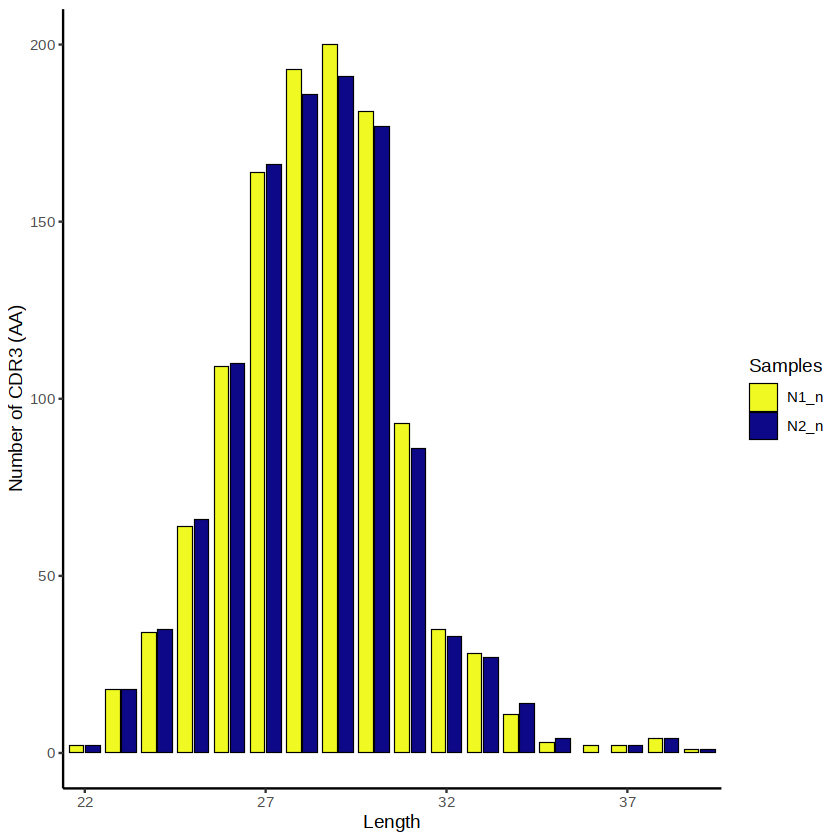

In [40]:
lengthContig(combinednor, 
             cloneCall = "aa", 
             chain = "both") 

In [41]:
length <- lengthContig(combinednor, 
             cloneCall = "aa", 
             chain = "both",
            scale=TRUE)

length$data
N1length <- subset(length$data, subset = values == "N1_n")
N2length <- subset(length$data, subset = values == "N2_n")


count_length <- function(data) {
  counts <- table(data$length)
  result <- data.frame(length = as.numeric(names(counts)),
                       count = as.vector(counts))
  return(result)
}

length,CT,values
<int>,<chr>,<fct>
24,CVVNDYKLSF_CASSGTAADTEAFF,N1_n
29,CIVRGTGGTSYGKLTF_CASSADRGYEQYF,N1_n
32,CAGAGMDSSYKLIF_CASRTFDRVLSGANVLTF,N1_n
30,CAENMSGAGSYQLTF_CASSLRTGNDYGYTF,N1_n
29,CAGPYNNNDMRF_CASSQGPSAMSPGELFF,N1_n
30,CAVNPPYSGAGSYQLTF_CSAWDRDYNEQFF,N1_n
30,CAVNYAGNNRKLIW_CASSVVRGHTNEKLFF,N1_n
32,CAVSDDGATNKLIF_CASSSSSGRAGSYNEQFF,N1_n
29,CIVRVMEYGNKLVF_CAISGGLGGTDTQYF,N1_n


In [44]:
percentage=NULL
result2 <- count_length(N2length)
sum(result2$count)
for(i in 1: nrow(result2)){
    percentage[i] <- result2$count[i]/sum(result2$count)*100
    result2[i,"percentage(%)"] <- percentage[i]
}
result2
sum(result2$count)

[1] 1122

length,count,percentage(%)
<dbl>,<int>,<dbl>
22,2,0.17825312
23,18,1.60427807
24,35,3.11942959
25,66,5.88235294
26,110,9.80392157
27,166,14.79500891
28,186,16.57754011
29,191,17.02317291
30,177,15.77540107


[1] 1122

ERROR: Error in barplot(`percentage(%)` ~ length, result2, beside = TRUE, ylab = "percentage(%)") + : non-numeric argument to binary operator


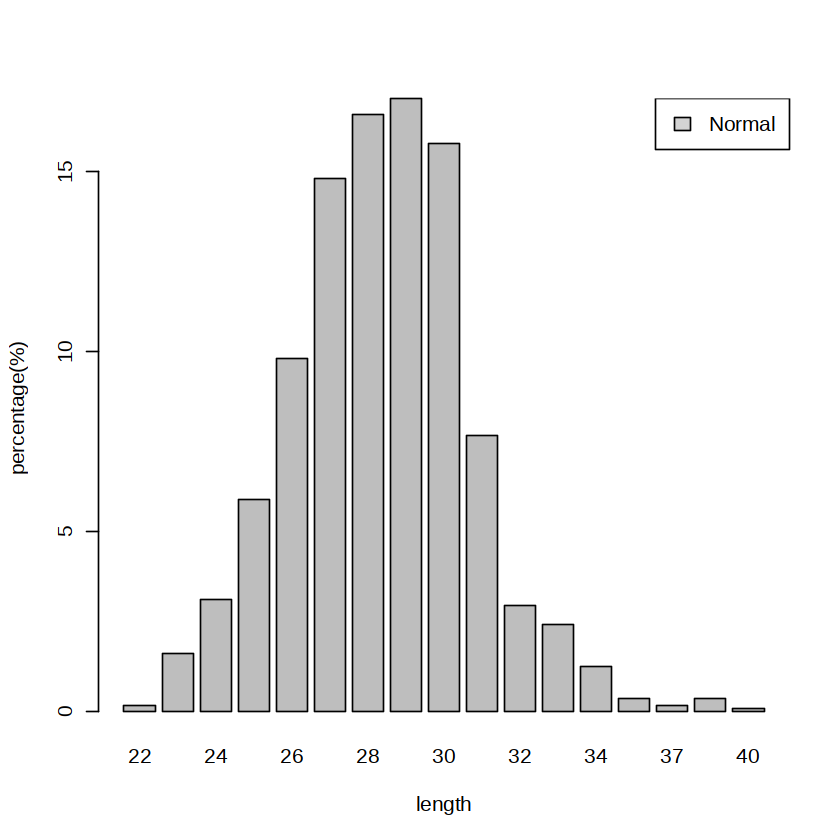

In [46]:
barplot(`percentage(%)`~length, result2)
barplot(`percentage(%)`~length, result2, beside=TRUE,ylab="percentage(%)")+legend("topright",legend=c("Normal"),fill=c('light gray'))

Warning message:
“The dot-dot notation (`..scaled..`) was deprecated in ggplot2 3.4.0.
ℹ Please use `after_stat(scaled)` instead.
ℹ The deprecated feature was likely used in the scRepertoire package.
  Please report the issue to the authors.”


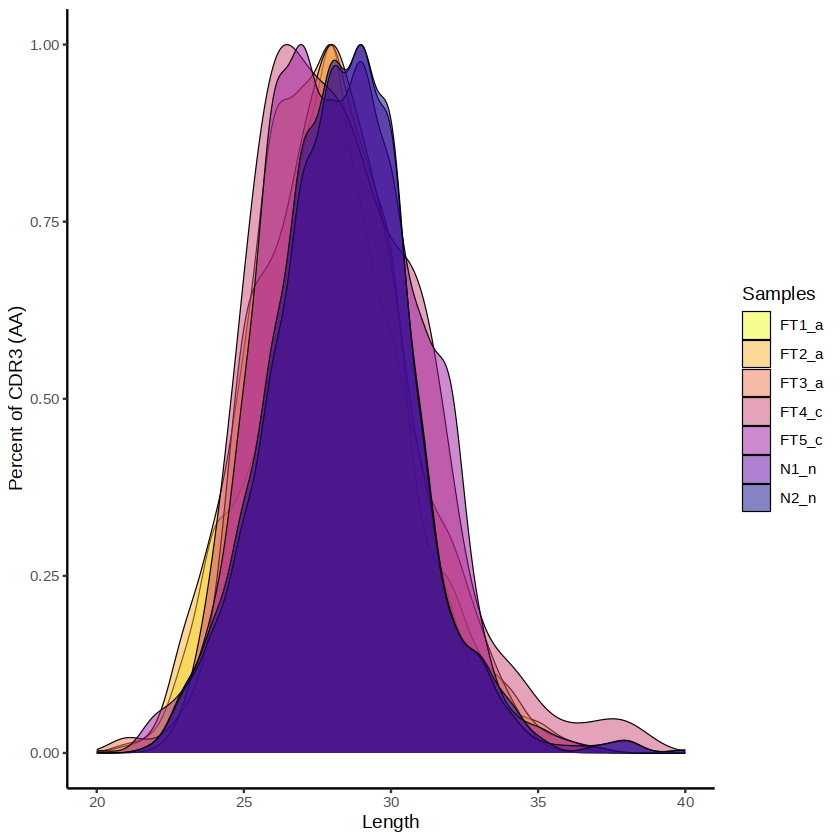

In [25]:
lengthContig(combined, 
             cloneCall = "aa", 
             chain = "both",
            scale=TRUE) 

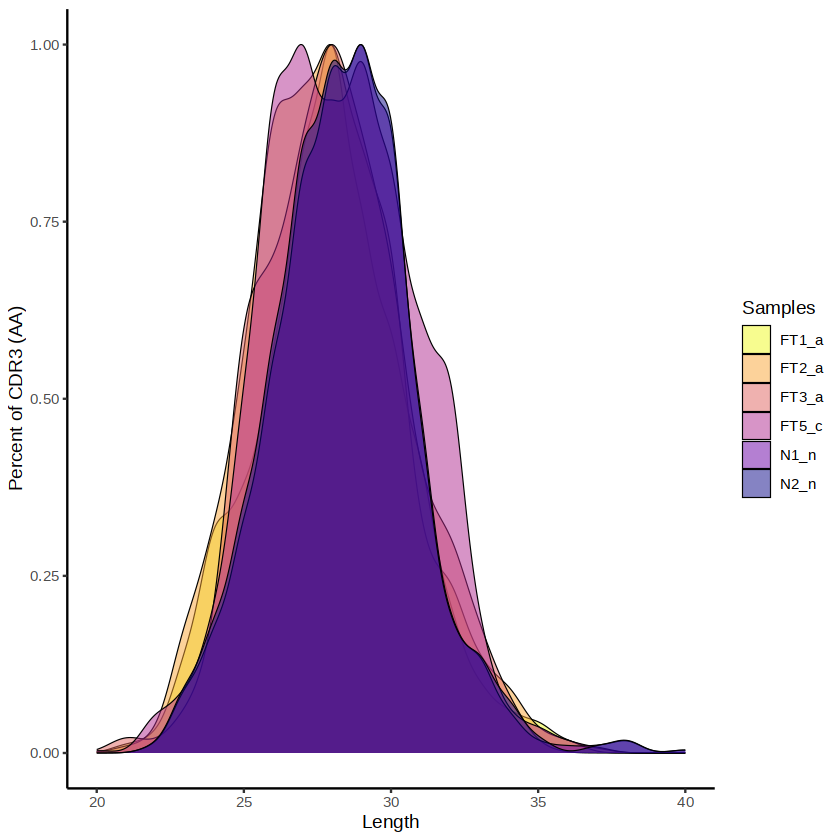

In [ ]:
lengthContig(combined[-4], 
             cloneCall = "aa", 
             chain = "both",
            scale=TRUE) 

Warning message:
“The dot-dot notation (`..scaled..`) was deprecated in ggplot2 3.4.0.
ℹ Please use `after_stat(scaled)` instead.
ℹ The deprecated feature was likely used in the scRepertoire package.
  Please report the issue to the authors.”


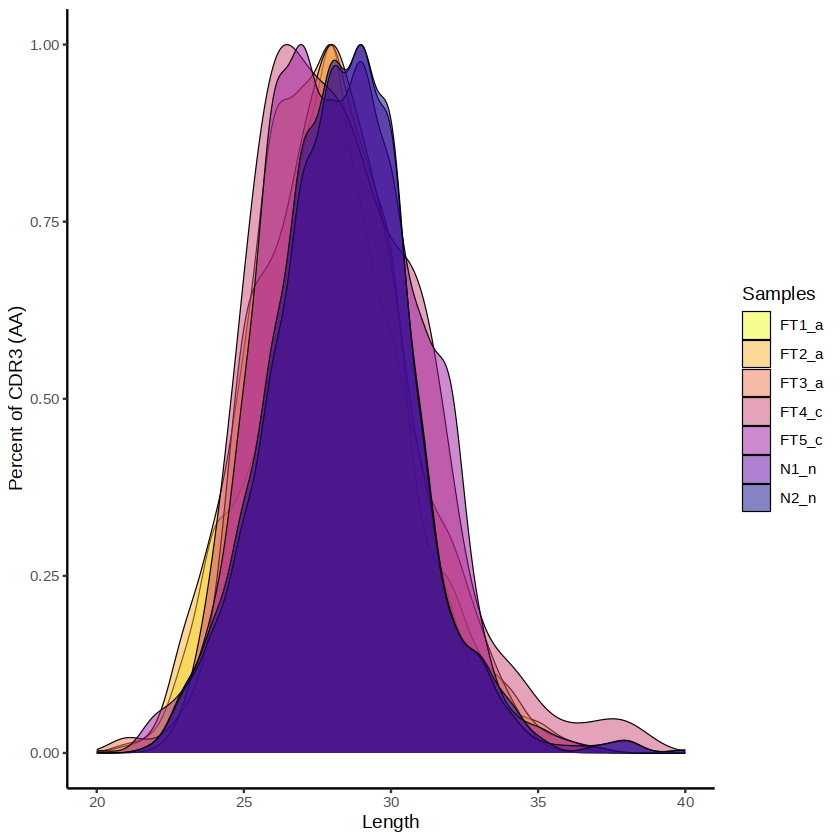

In [25]:
lengthContig(combined, 
             cloneCall = "aa", 
             chain = "both",
            scale=TRUE) 

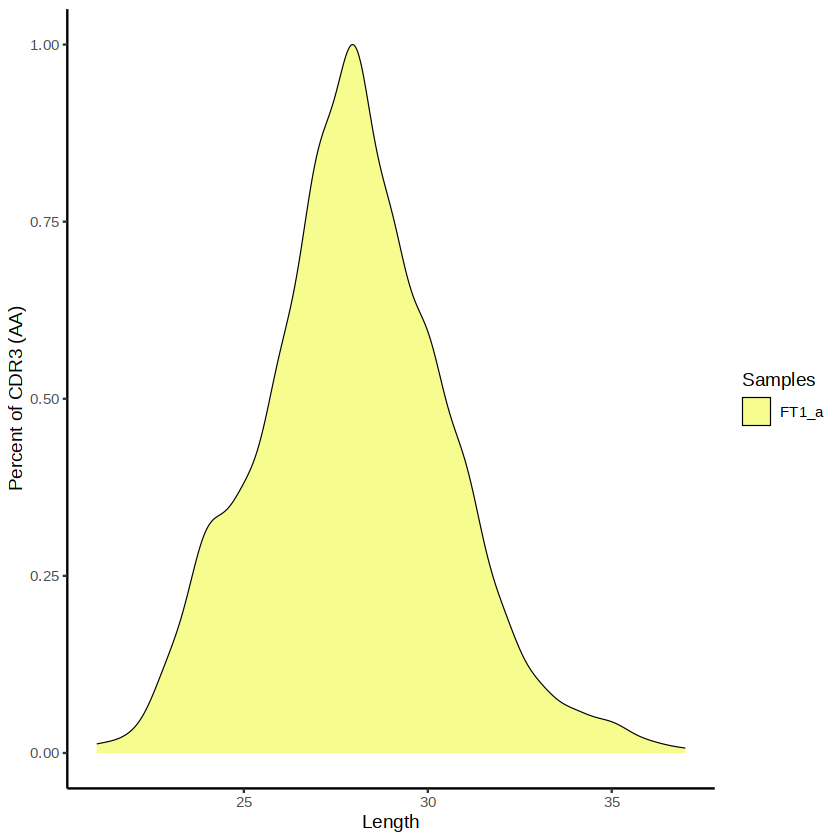

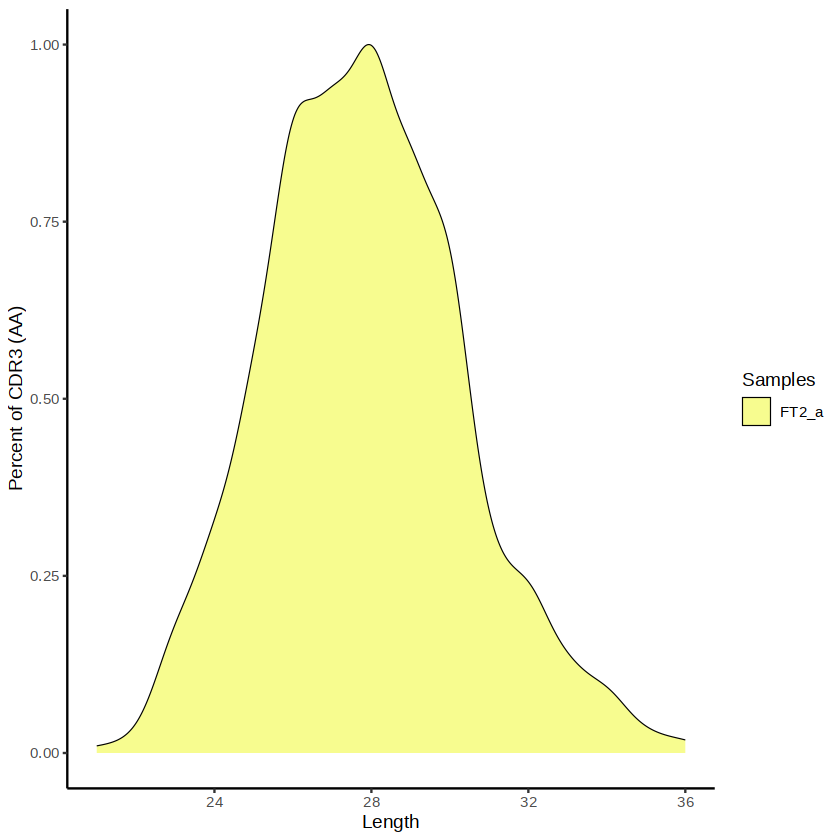

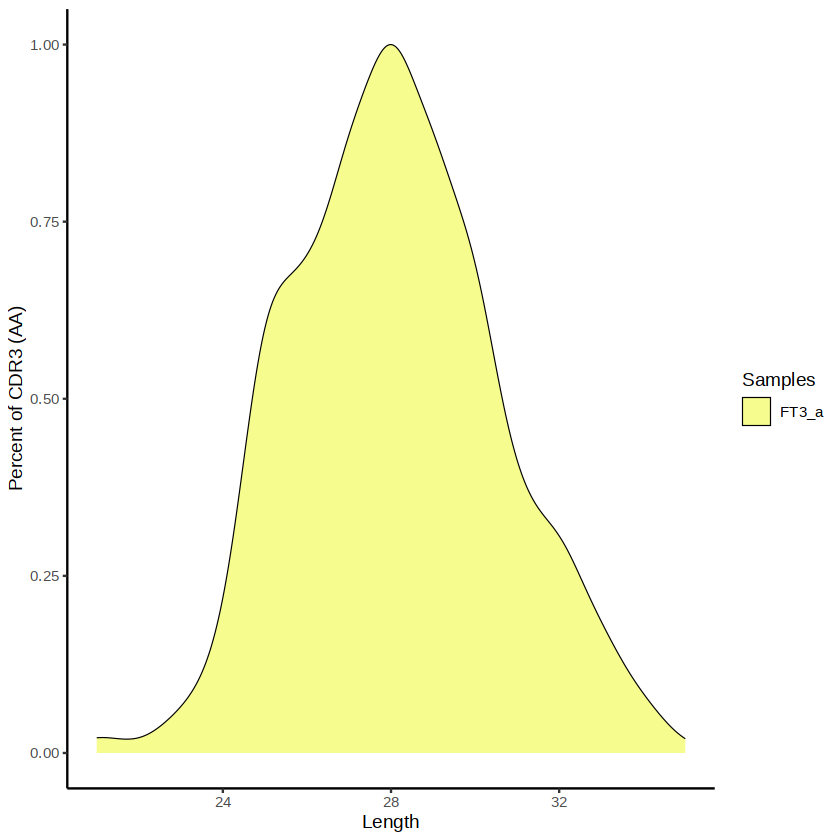

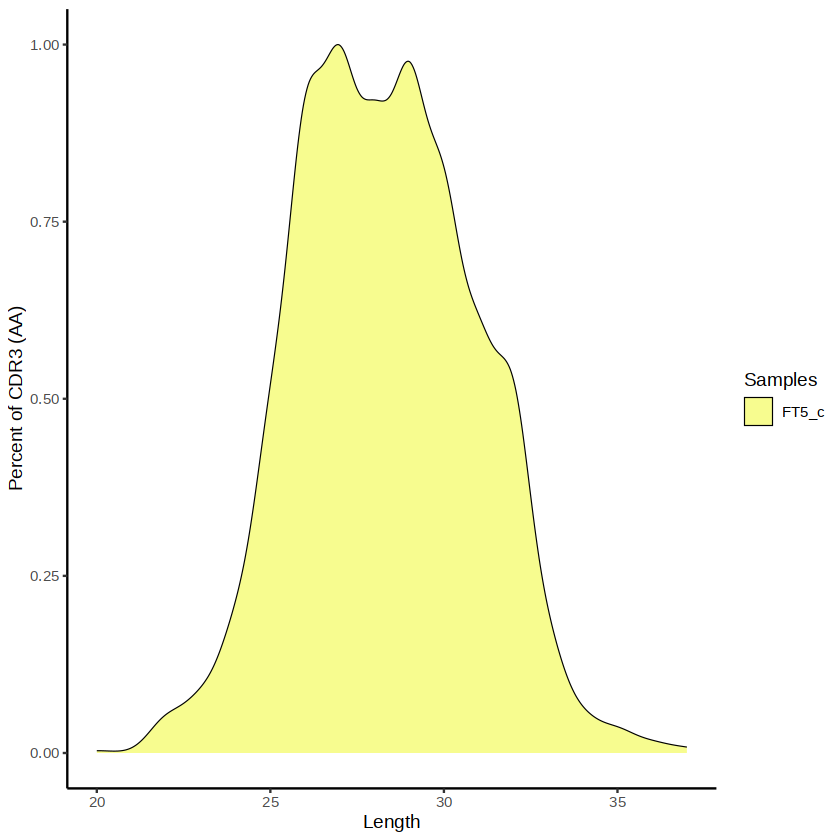

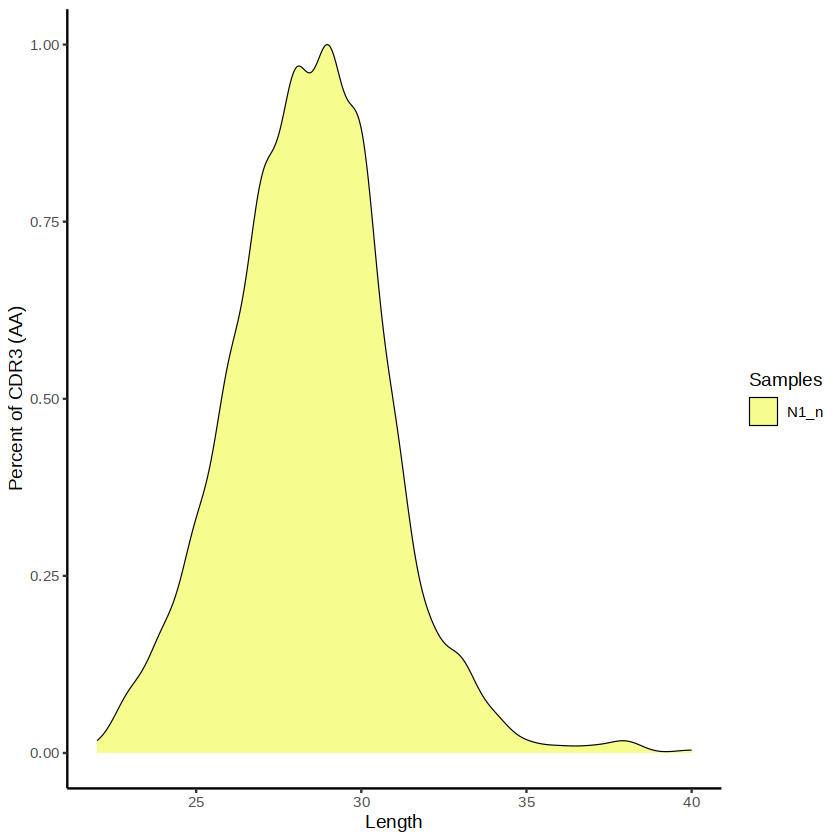

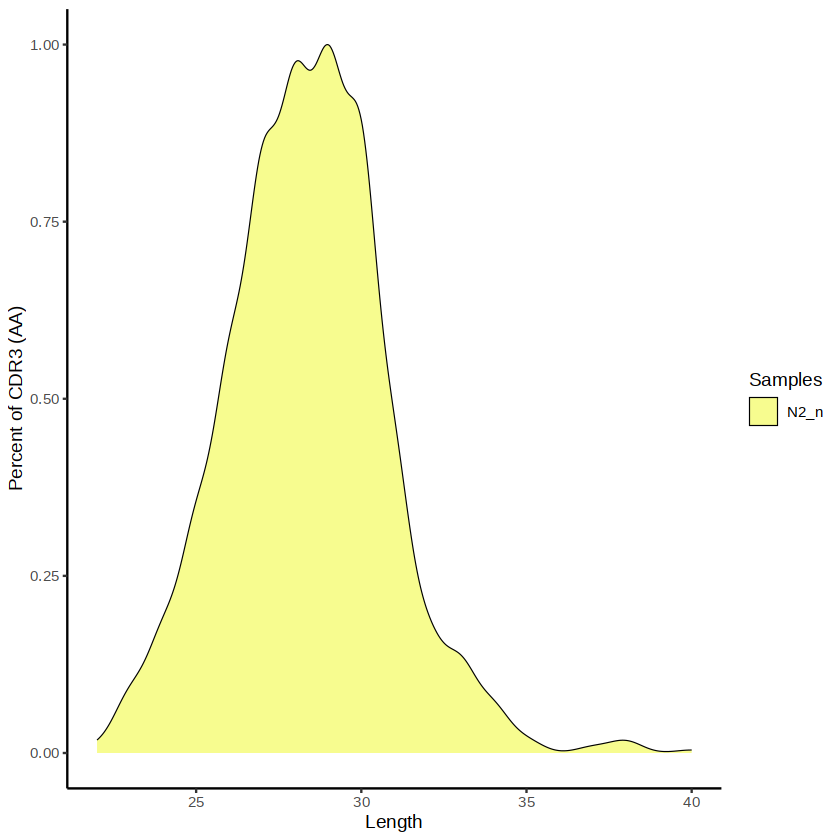

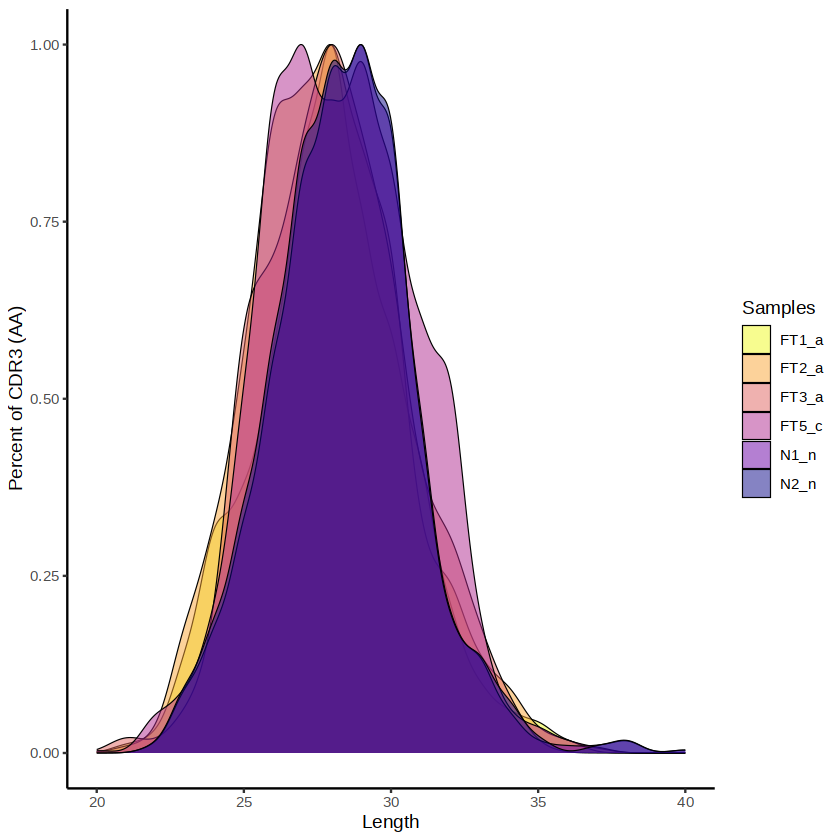

In [26]:
lengthContig(combined_woft4[1], 
             cloneCall = "aa", 
             chain = "both",
             split.by = "samples",
            scale=TRUE) 
lengthContig(combined_woft4[2], 
             cloneCall = "aa", 
             chain = "both",
             split.by = "samples",
            scale=TRUE) 
lengthContig(combined_woft4[3], 
             cloneCall = "aa", 
             chain = "both",
             split.by = "samples",
            scale=TRUE) 
lengthContig(combined_woft4[4], 
             cloneCall = "aa", 
             chain = "both",
             split.by = "samples",
            scale=TRUE) 
lengthContig(combined_woft4[5], 
             cloneCall = "aa", 
             chain = "both",
             split.by = "samples",
            scale=TRUE) 
lengthContig(combined_woft4[6], 
             cloneCall = "aa", 
             chain = "both",
             split.by = "samples",
            scale=TRUE) 
lengthContig(combined_woft4, 
             cloneCall = "aa", 
             chain = "both",
             split.by = "samples",
            scale=TRUE) 

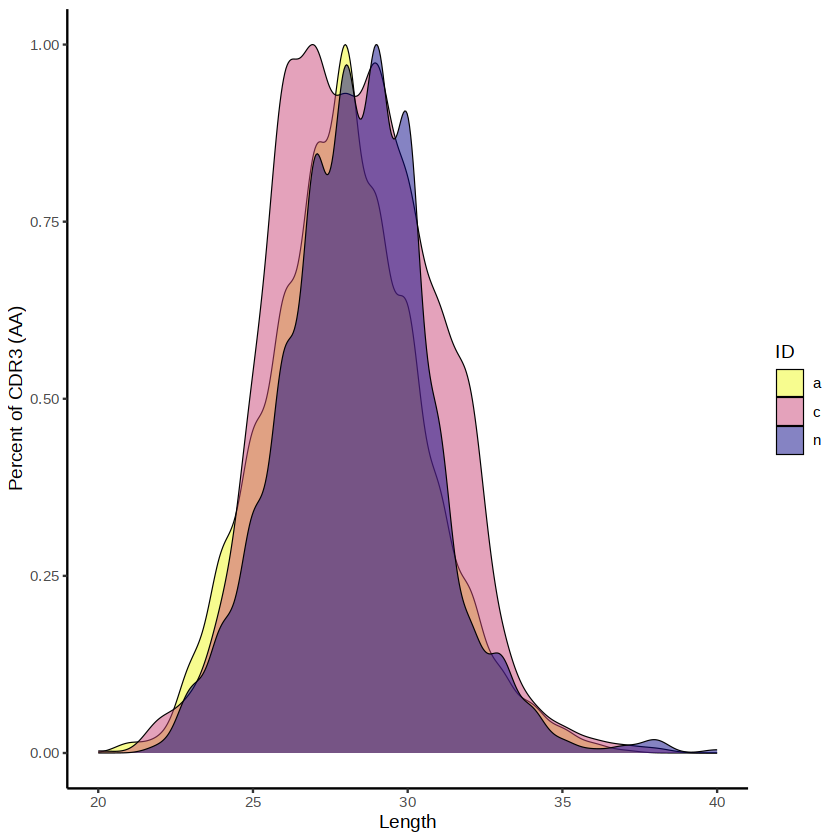

In [53]:
lengthContig(combined, 
             cloneCall = "aa", 
             chain = "both",
             group.by = "ID",
            scale=TRUE)

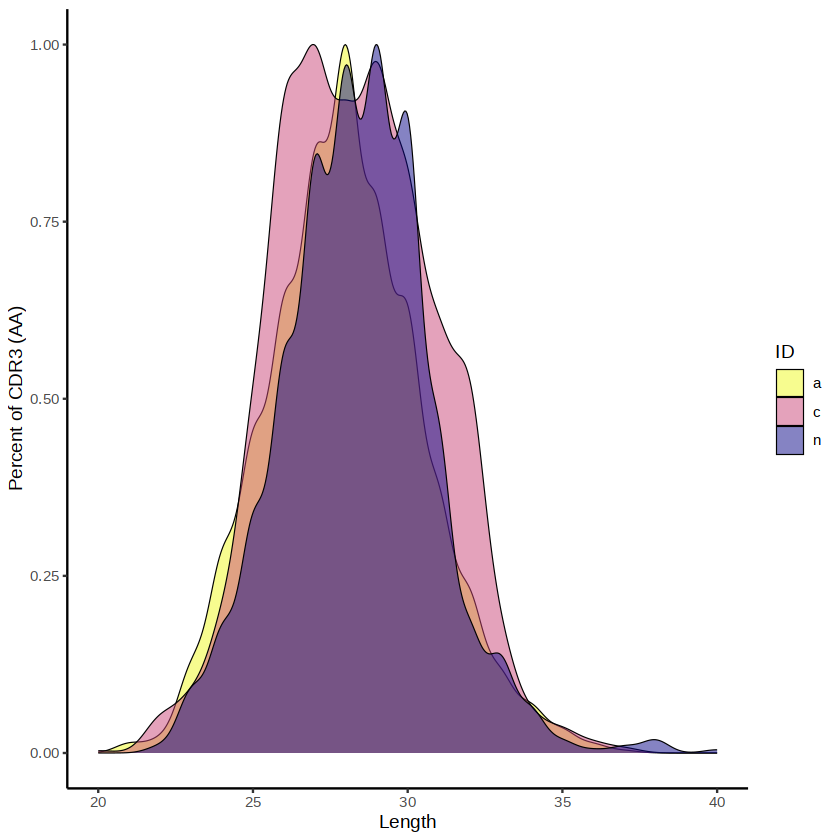

In [13]:
lengthContig(combined_woft4, 
             cloneCall = "aa", 
             chain = "both",
             group.by = "ID",
            scale=TRUE)

In [5]:
cdr3length_distribution <- lengthContig(combined_woft4, 
             cloneCall = "aa", 
             chain = "both",
             group.by = "ID",
            scale=TRUE,
            exportTable = TRUE)

ERROR: Error in list.input.return(df, split.by): object 'combined_woft4' not found


In [4]:
alength <- subset(cdr3length_distribution$length, subset = cdr3length_distribution$ID == "a")
clength <- subset(cdr3length_distribution$length, subset = cdr3length_distribution$ID == "c")
nlength <- subset(cdr3length_distribution$length, subset = cdr3length_distribution$ID == "n")

mean(alength)
mean(clength)
mean(nlength)

median(alength)
median(clength)
median(nlength)

sd(alength)
sd(clength)
sd(nlength)

min(alength)
min(clength)
min(nlength)

max(alength)
max(clength)
max(nlength)

ERROR: Error in subset(cdr3length_distribution$length, subset = cdr3length_distribution$ID == : object 'cdr3length_distribution' not found


In [20]:
cdr3length_distribution
saveRDS(cdr3length_distribution, '/home/jurny0402/231116_nor,FTC_seurat/data/231212_cdr3length_distribution.rds')

length,CT,ID,values
<int>,<chr>,<chr>,<chr>
29,CAAIRYTGTASKLTF_CATSDKYLNQPQHF,a,FT1_a
30,CGTEIYNQGGKLIF_CASSVGPQVGNYGYTF,a,FT1_a
29,CALRRSGGSNYKLTF_CSVEGGLSSGTQYF,a,FT1_a
28,CAVSMNRDDKIIF_CASSLAGSTNEKLFF,a,FT1_a
33,CVVRRDNYGQNFVF_CASSYLPSGLAPMNTEAFF,a,FT1_a
28,CAGQAGANSKLTF_CSARPGNRGKETQYF,a,FT1_a
28,CAVEPNDYKLSF_CASSLSGGAYTGELFF,a,FT1_a
30,CAVGANSGYALNF_CASSFDLVGLVNTEAFF,a,FT1_a
28,CAVGDSGGYNKLIF_CASSPRVGANVLTF,a,FT1_a


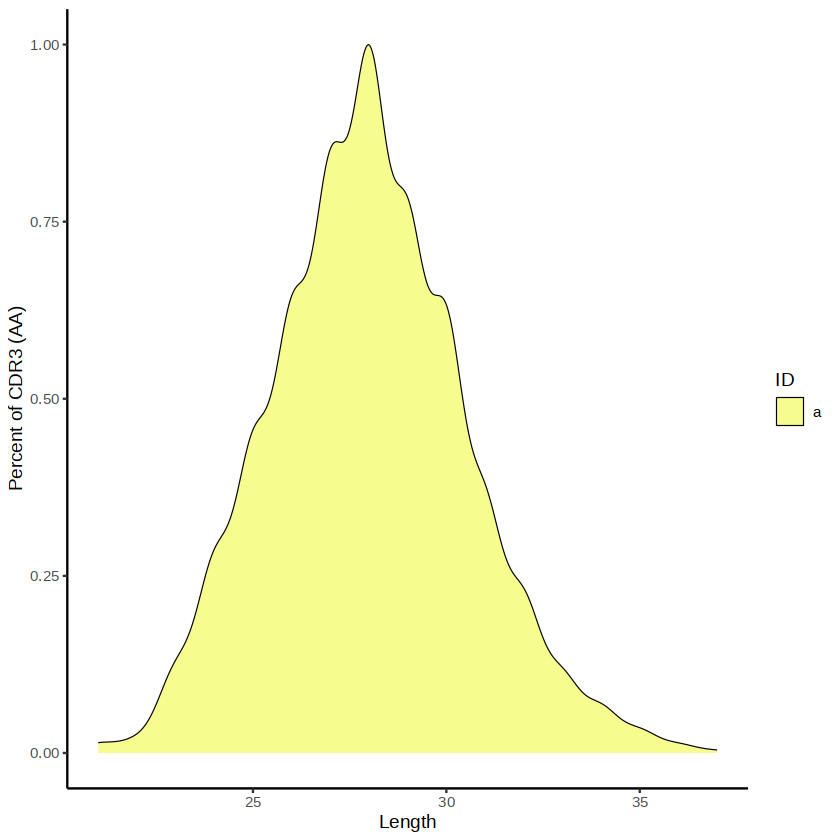

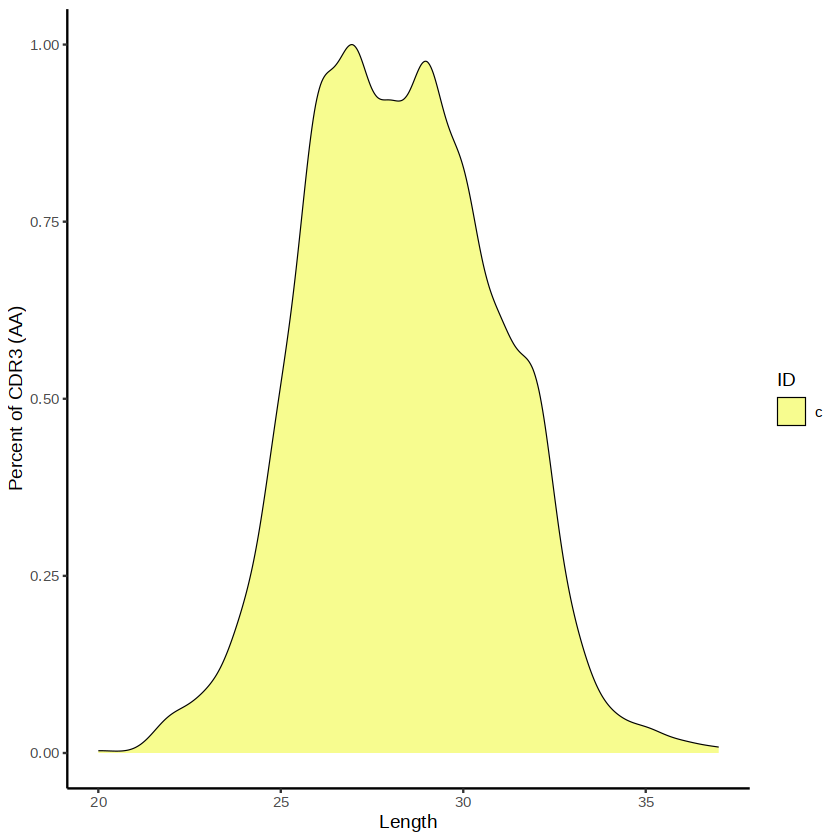

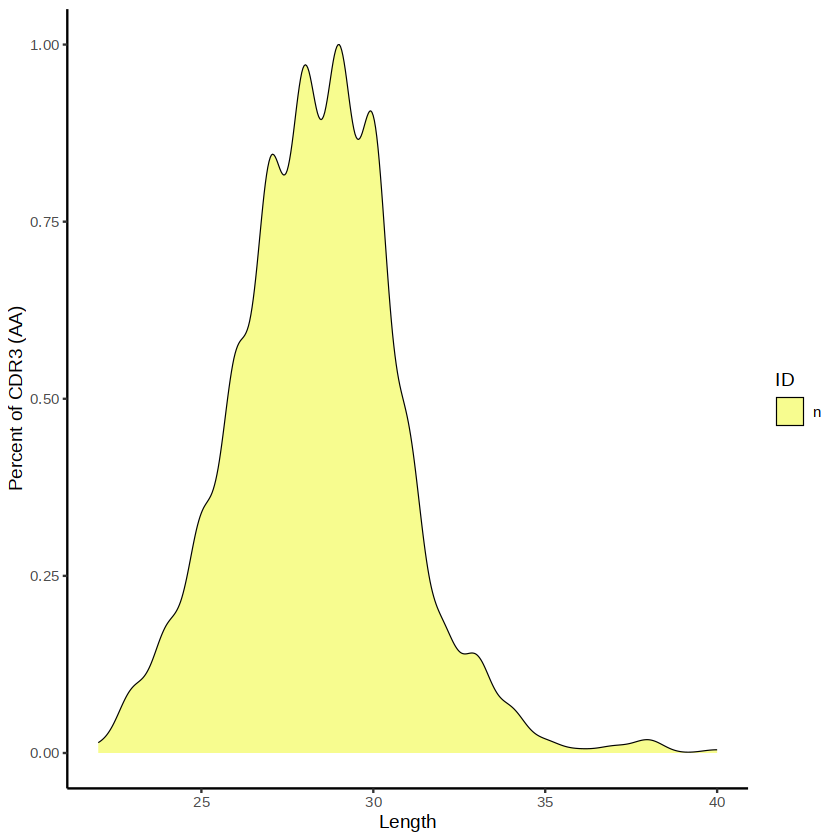

In [16]:
lengthContig(combined_woft4[c(1,2,3)], 
             cloneCall = "aa", 
             chain = "both",
             group.by = "ID",
            scale=TRUE)
lengthContig(combined_woft4[4], 
             cloneCall = "aa", 
             chain = "both",
             group.by = "ID",
            scale=TRUE)
lengthContig(combined_woft4[c(5,6)], 
             cloneCall = "aa", 
             chain = "both",
             group.by = "ID",
            scale=TRUE)

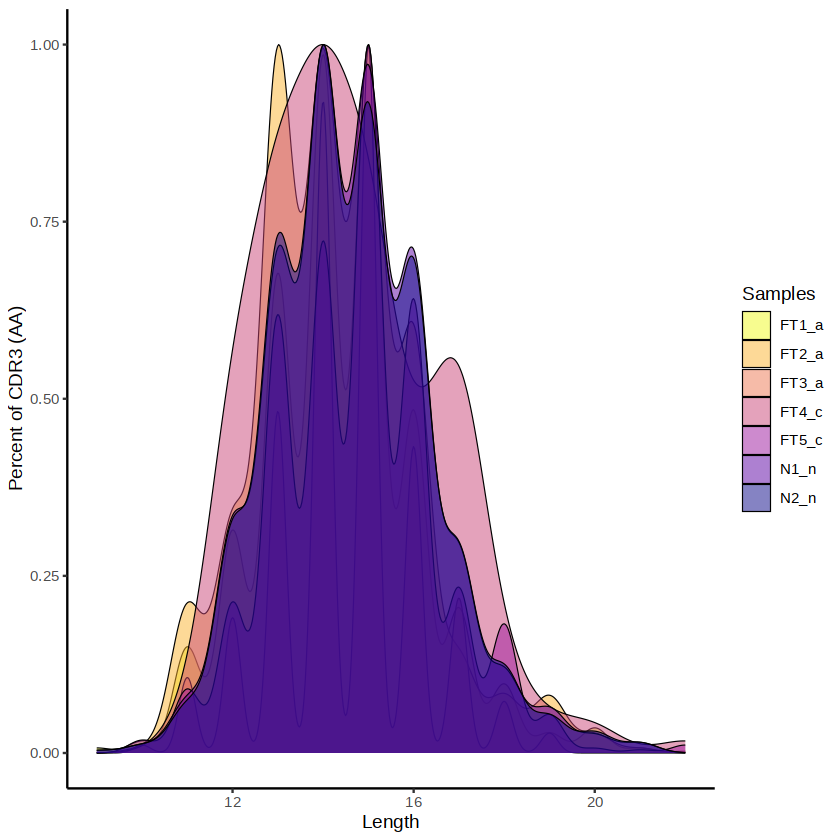

In [13]:
lengthContig(combined, 
             cloneCall = "aa", 
             chain = "TRB",
            scale=TRUE) 

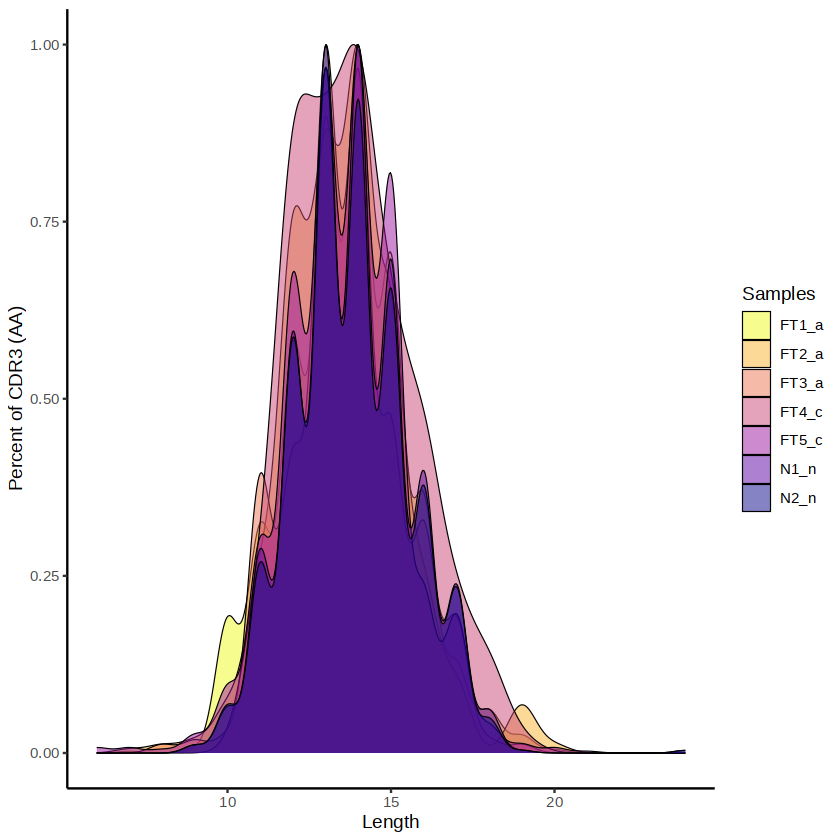

In [14]:
lengthContig(combined, 
             cloneCall = "aa", 
             chain = "TRA",
            scale=TRUE) 

In [6]:
combined_woft4 <- combined[-4]

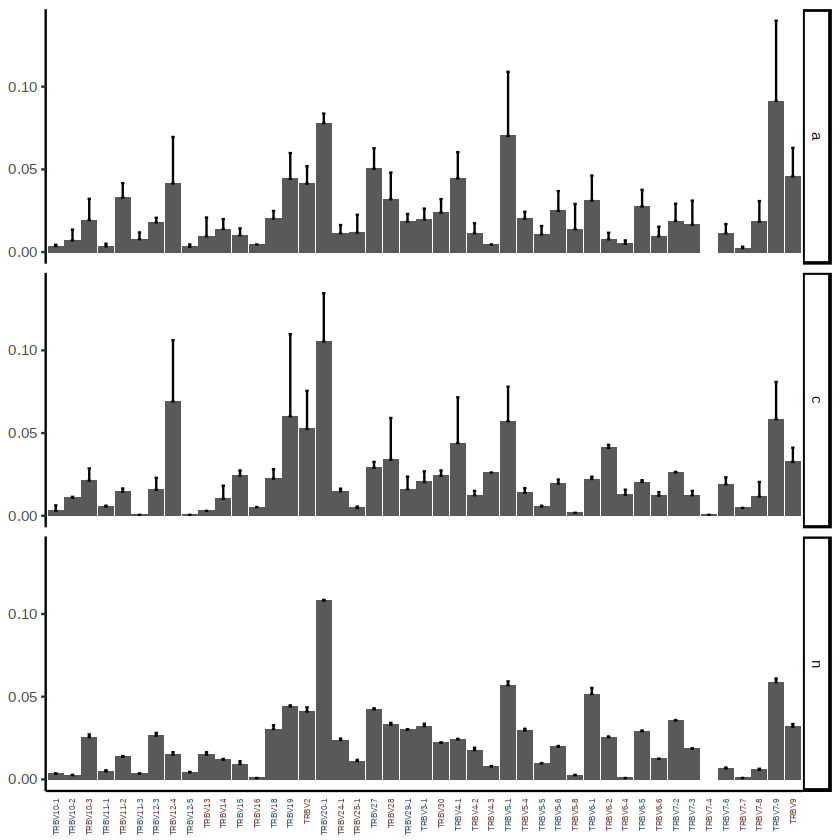

In [16]:
vizGenes(combined, 
         gene = "V", 
         chain = "TRB", 
         plot = "bar",
         y.axis = "ID",
         order="gene",
         scale = TRUE)

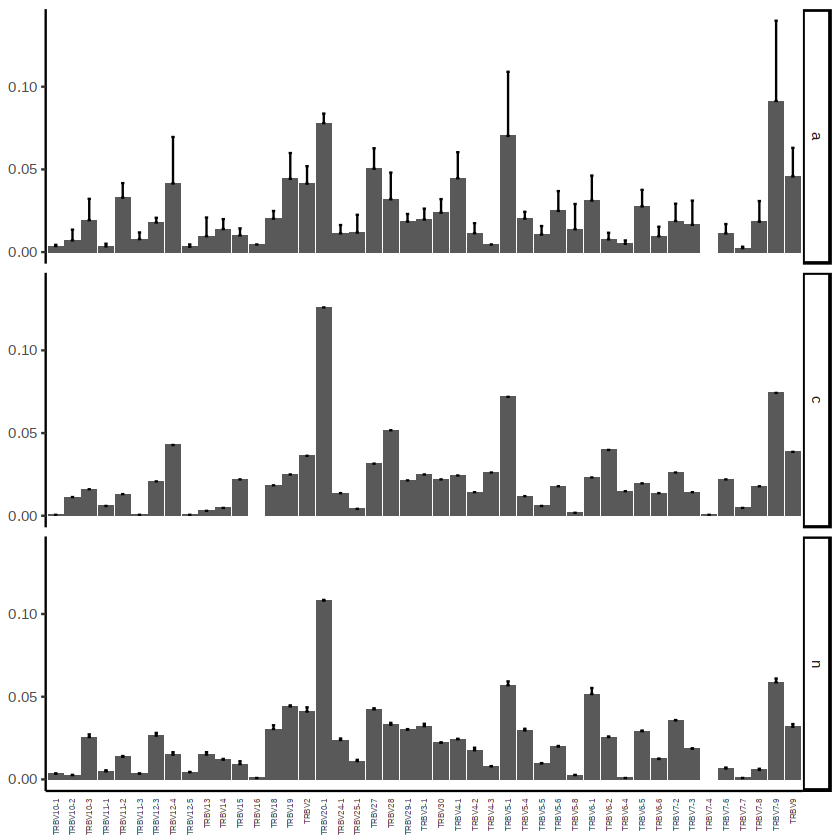

In [22]:
vizGenes(combined_woft4, 
         gene = "V", 
         chain = "TRB", 
         plot = "bar",
         y.axis = "ID",
         order="gene",
         scale = TRUE)

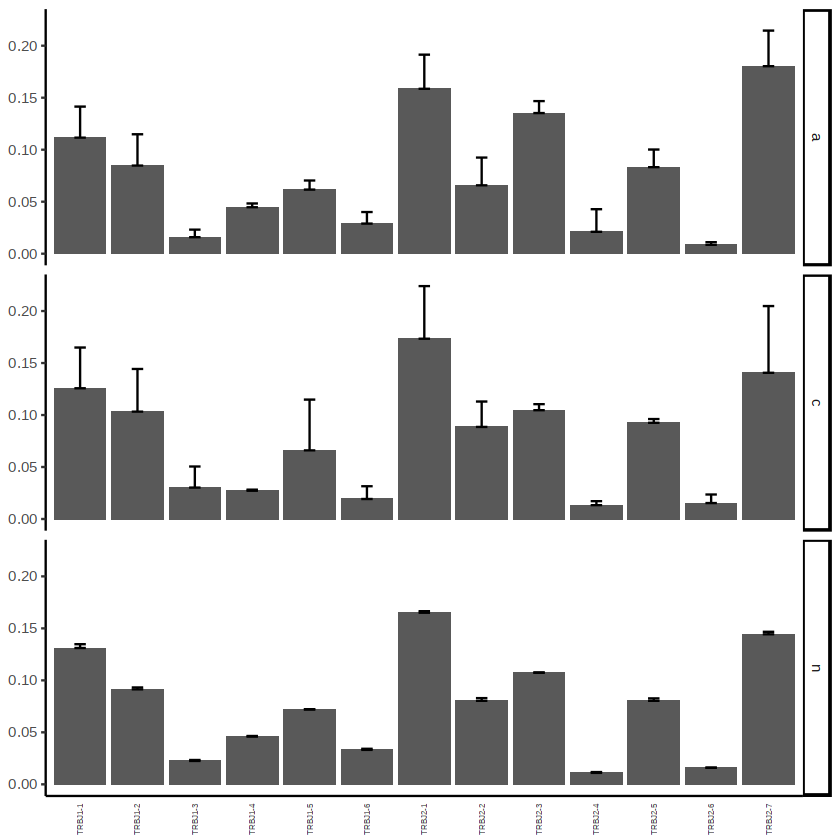

In [17]:
vizGenes(combined, 
         gene = "J", 
         chain = "TRB", 
         plot = "bar",
         y.axis = "ID",
         order="gene",
         scale = TRUE)

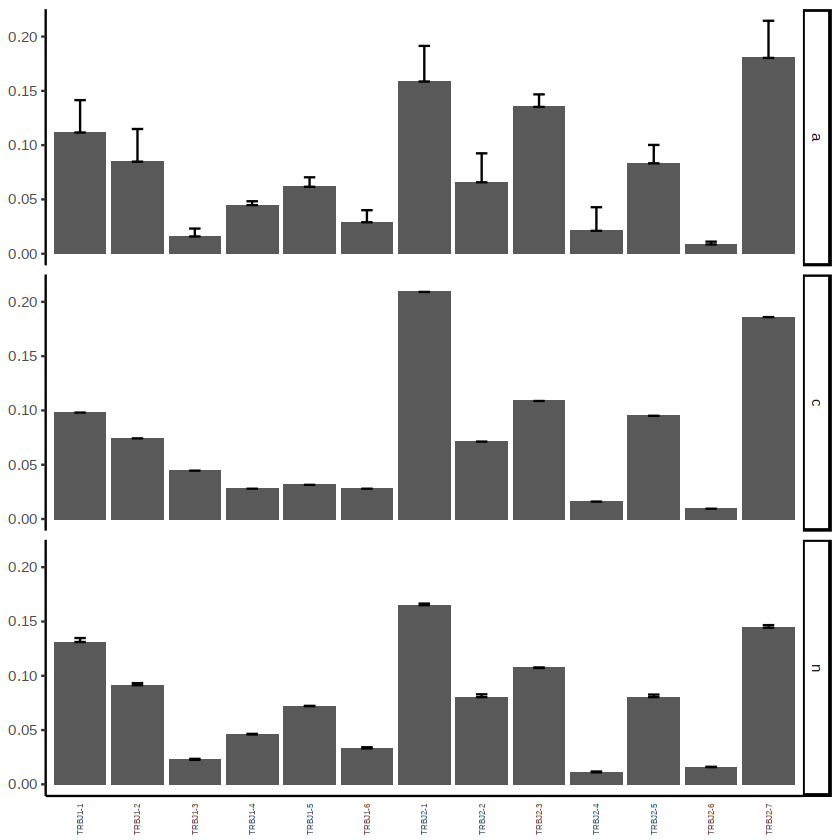

In [23]:
vizGenes(combined_woft4, 
         gene = "J", 
         chain = "TRB", 
         plot = "bar",
         y.axis = "ID",
         order="gene",
         scale = TRUE)

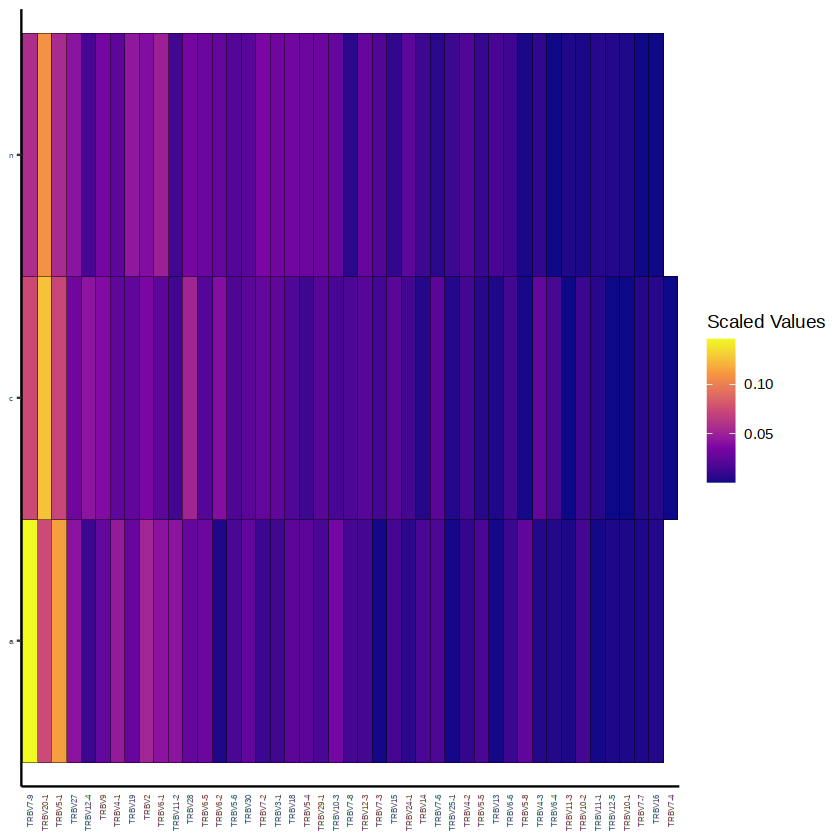

In [18]:
vizGenes(combined[c(1,2,3,4,5,6,7)], 
         gene = "V", 
         chain = "TRB", 
         plot = "heatmap",
         y.axis = "ID",
         order="variance",
         scale = TRUE)

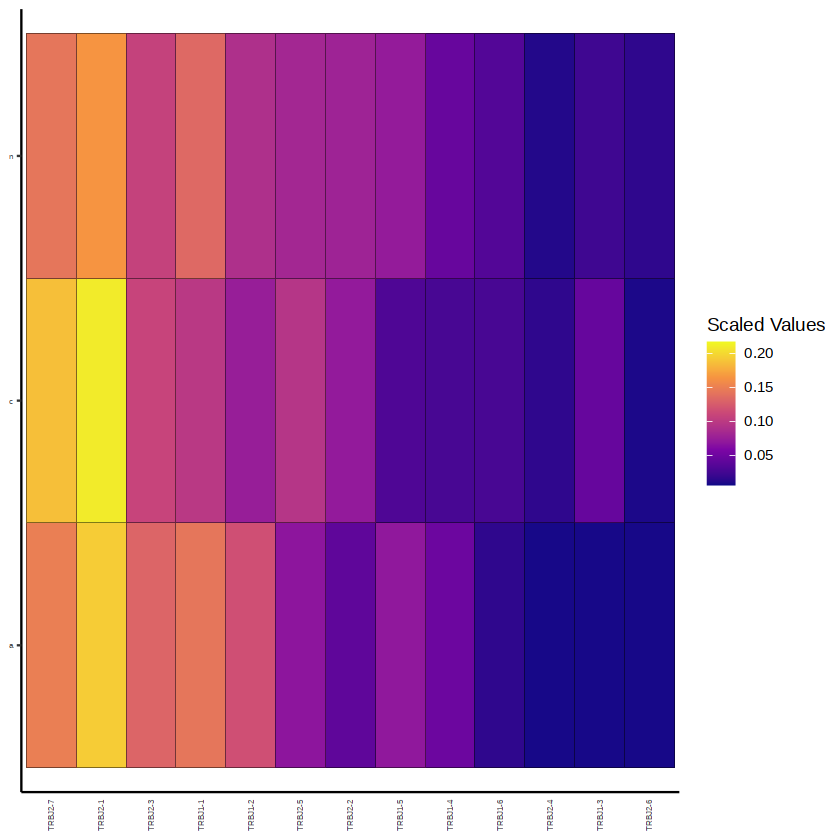

In [19]:
vizGenes(combined[c(1,2,3,4,5,6,7)], 
         gene = "J", 
         chain = "TRB", 
         plot = "heatmap",
         y.axis = "ID",
         order="variance",
         scale = TRUE)

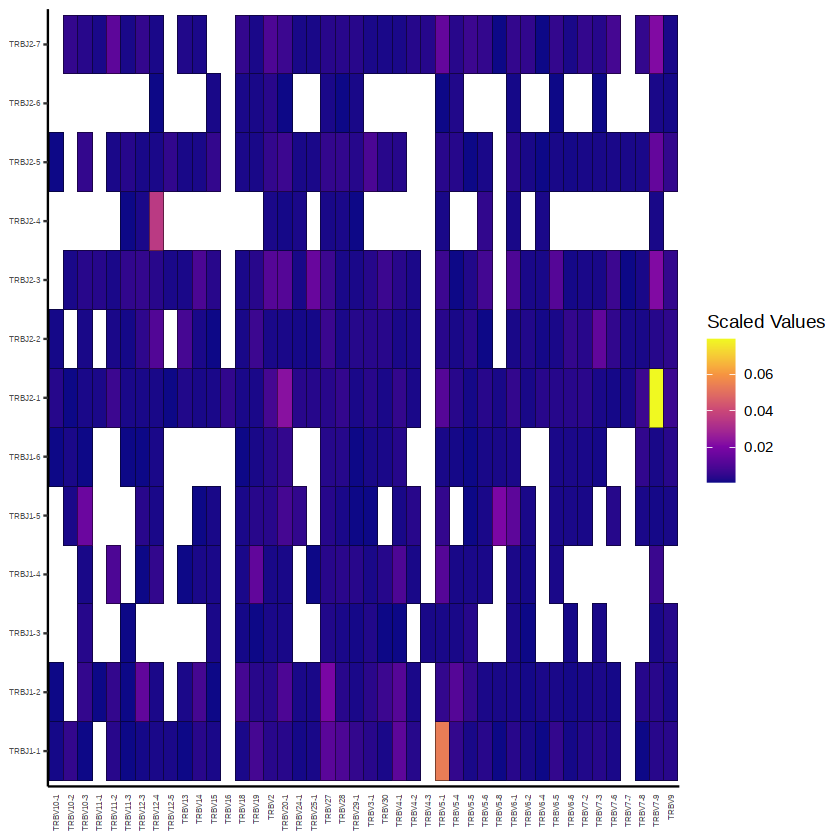

In [20]:
vizGenes(combined[c(1,2,3)],
        gene = "V",
        chain = "TRB",
        y.axis = "J",
        plot = "heatmap",
        scale = TRUE,
        order = "gene")

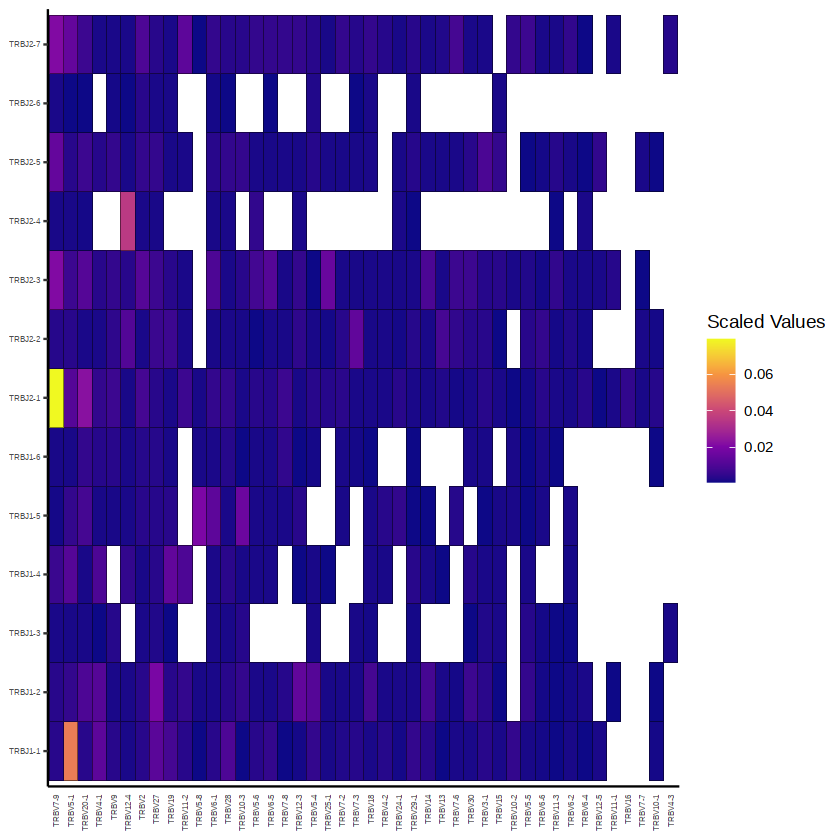

In [7]:
vizGenes(combined[c(1,2,3)],
        gene = "V",
        chain = "TRB",
        y.axis = "J",
        plot = "heatmap",
        scale = TRUE,
        order = "variance")

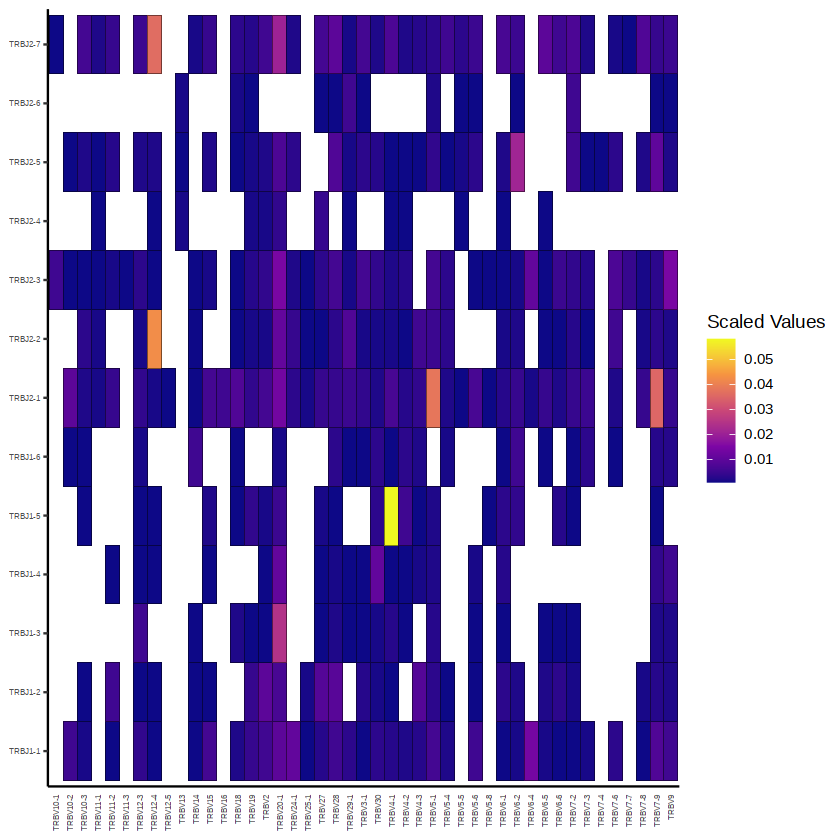

In [21]:
vizGenes(combined[c(4,5)],
        gene = "V",
        chain = "TRB",
        y.axis = "J",
        plot = "heatmap",
        scale = TRUE,
        order = "gene")

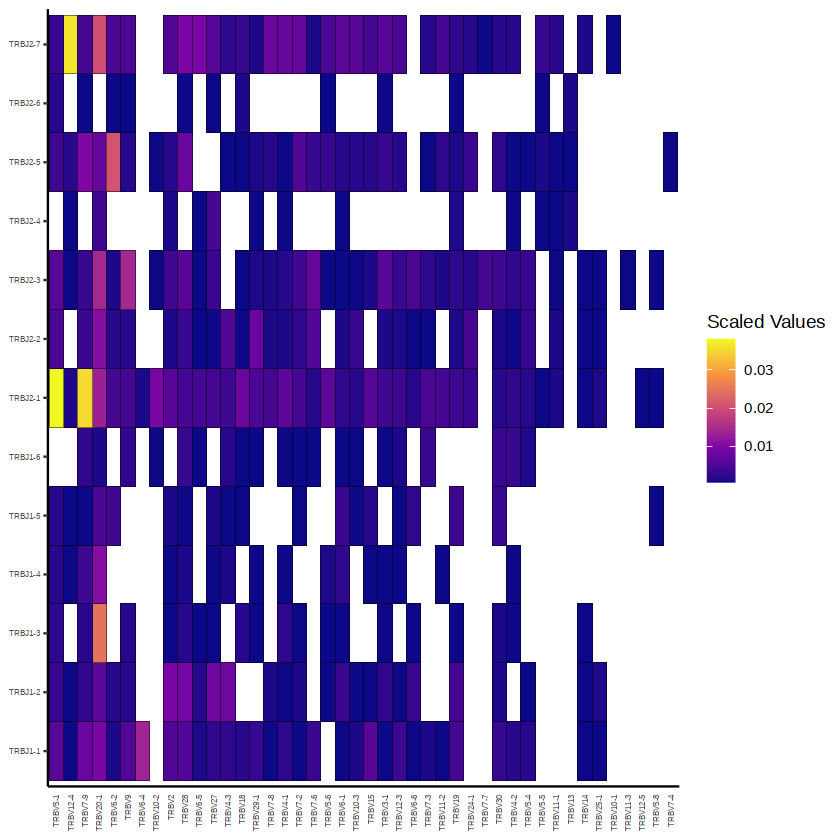

In [8]:
vizGenes(combined[c(5)],
        gene = "V",
        chain = "TRB",
        y.axis = "J",
        plot = "heatmap",
        scale = TRUE,
        order = "variance")

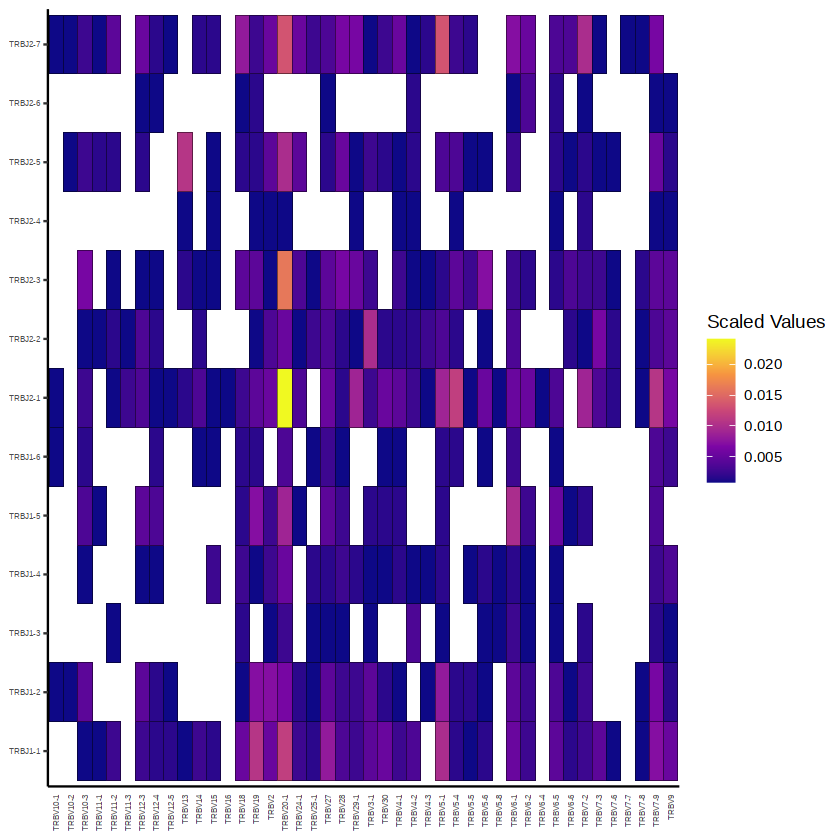

In [11]:
vizGenes(combined[c(6,7)],
        gene = "V",
        chain = "TRB",
        y.axis = "J",
        plot = "heatmap",
        scale = TRUE,
        order = "gene")

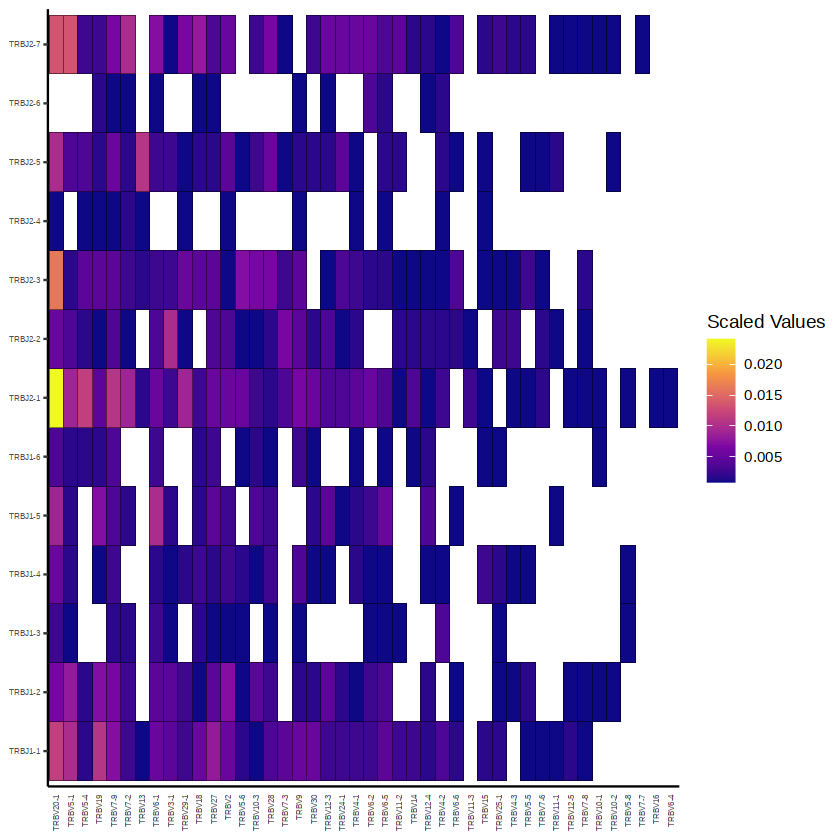

In [6]:
vizGenes(combined[c(6,7)],
        gene = "V",
        chain = "TRB",
        y.axis = "J",
        plot = "heatmap",
        scale = TRUE,
        order = "variance")

In [9]:
vizGenes(combined[c(6,7)],
        gene = "V",
        chain = "TRB",
        y.axis = "J",
        plot = "heatmap",
        scale = TRUE,
        order = "gene",
        exportTable = TRUE)

Var1,Var2,element.names,n,sum,varcount,sd,mean
<chr>,<chr>,<chr>,<dbl>,<int>,<dbl>,<dbl>,<dbl>
TRBV10-1,TRBJ1-2,N1_n,0.0008741259,1144,0.001765391,1.211961e-05,0.0008826957
TRBV10-1,TRBJ1-2,N2_n,0.0008912656,1122,0.001765391,1.211961e-05,0.0008826957
TRBV10-1,TRBJ1-6,N1_n,0.0008741259,1144,0.001765391,1.211961e-05,0.0008826957
TRBV10-1,TRBJ1-6,N2_n,0.0008912656,1122,0.001765391,1.211961e-05,0.0008826957
TRBV10-1,TRBJ2-1,N1_n,0.0008741259,1144,0.001765391,1.211961e-05,0.0008826957
TRBV10-1,TRBJ2-1,N2_n,0.0008912656,1122,0.001765391,1.211961e-05,0.0008826957
TRBV10-1,TRBJ2-7,N1_n,0.0008741259,1144,0.001765391,1.211961e-05,0.0008826957
TRBV10-1,TRBJ2-7,N2_n,0.0008912656,1122,0.001765391,1.211961e-05,0.0008826957
TRBV10-2,TRBJ1-2,N1_n,0.0008741259,1144,0.001765391,1.211961e-05,0.0008826957


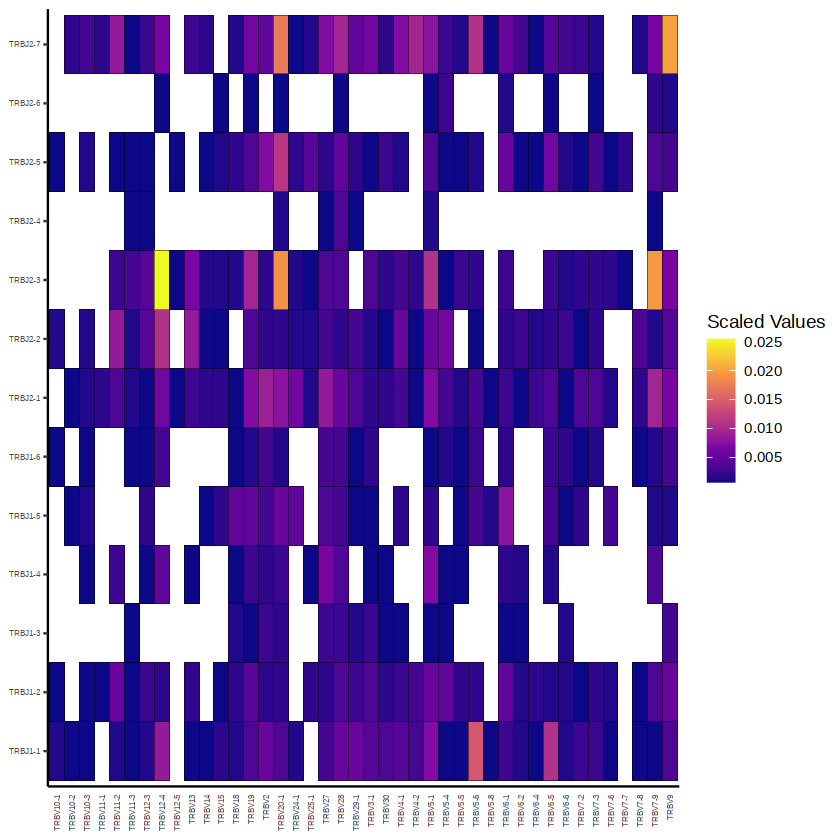

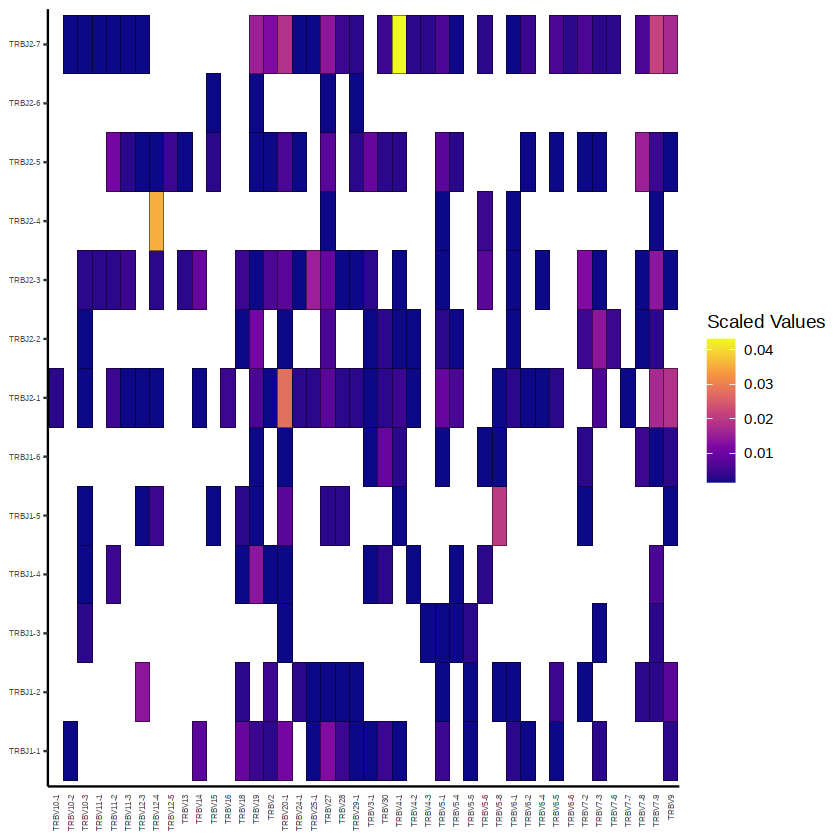

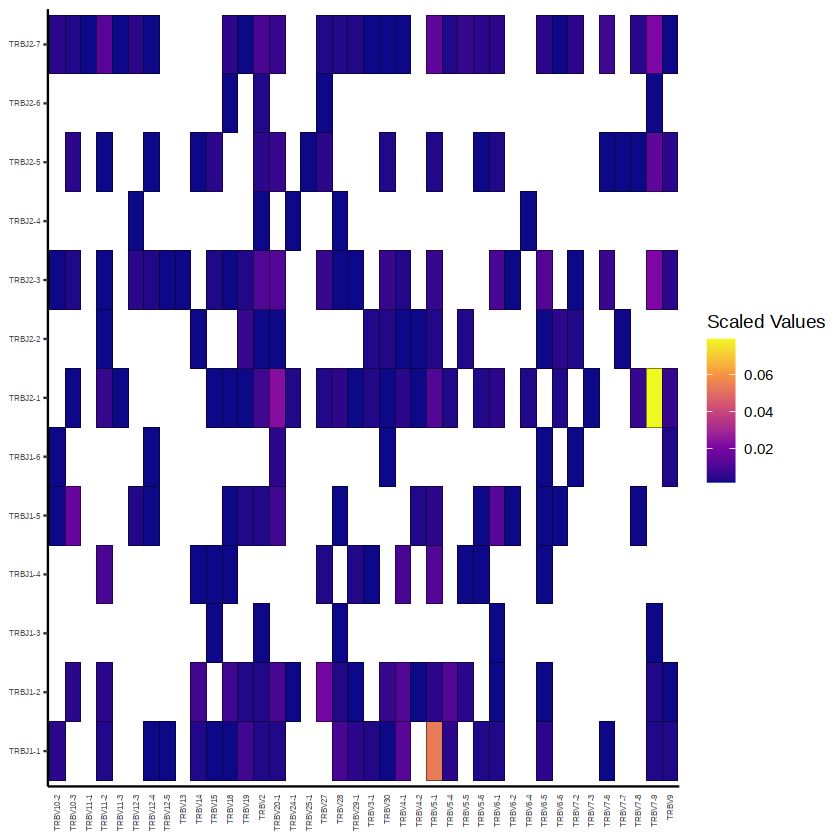

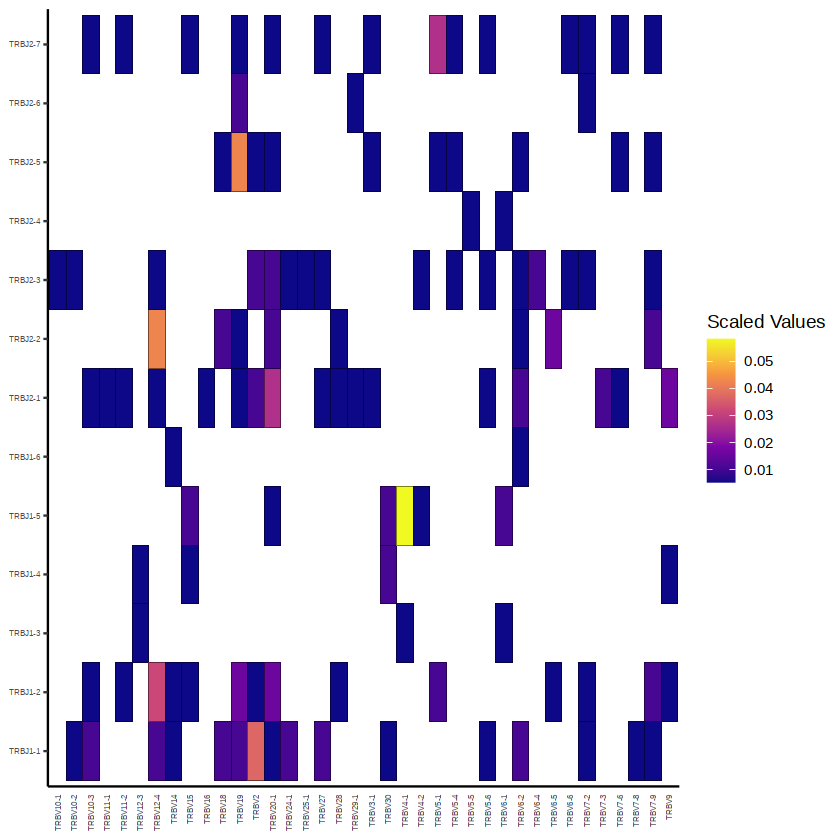

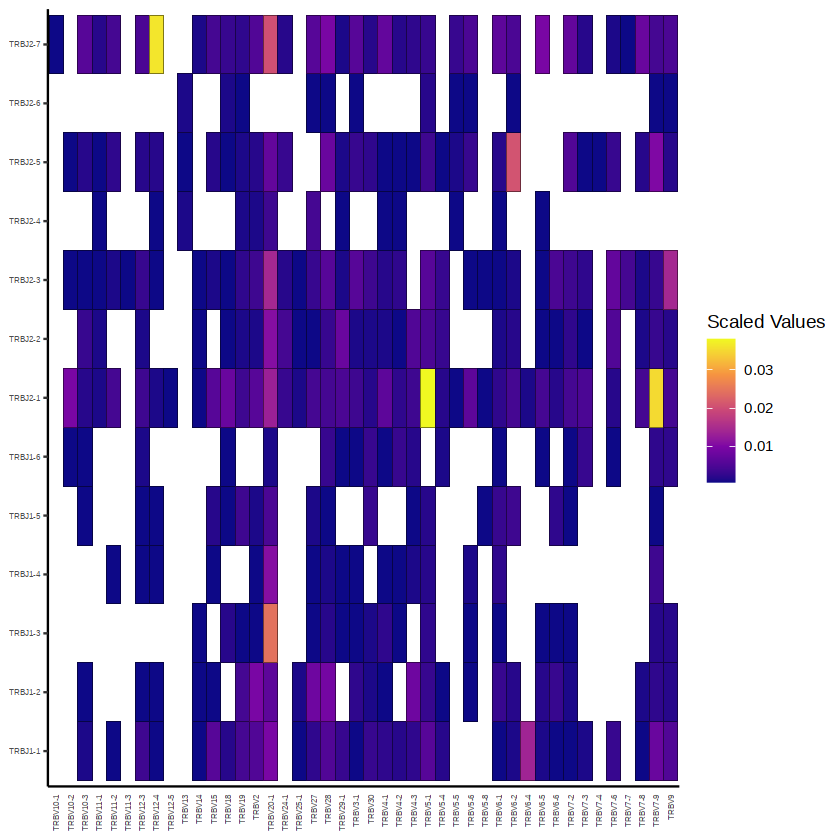

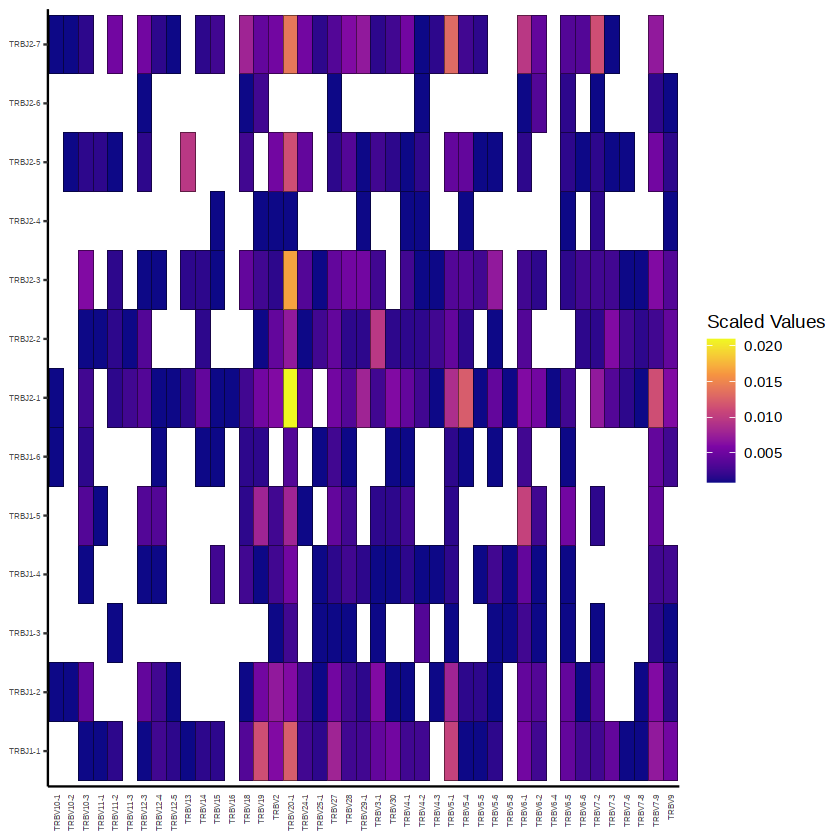

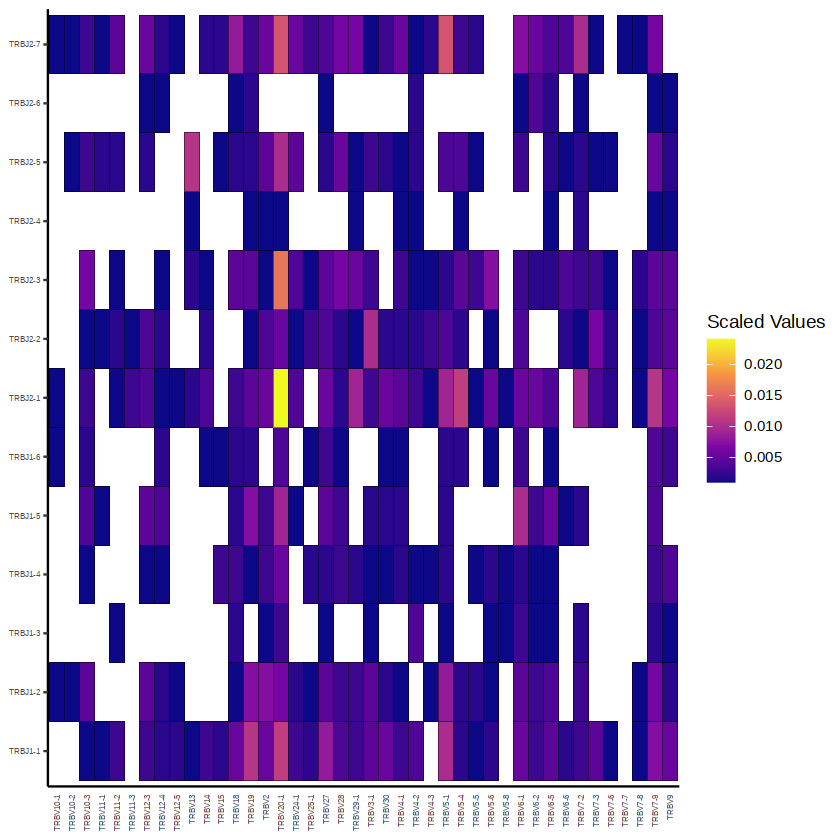

In [21]:
vizGenes(combined[1],
        gene = "V",
        chain = "TRB",
        y.axis = "J",
        plot = "heatmap",
        scale = TRUE,
        order = "gene")
vizGenes(combined[2],
        gene = "V",
        chain = "TRB",
        y.axis = "J",
        plot = "heatmap",
        scale = TRUE,
        order = "gene")
vizGenes(combined[3],
        gene = "V",
        chain = "TRB",
        y.axis = "J",
        plot = "heatmap",
        scale = TRUE,
        order = "gene")
vizGenes(combined[4],
        gene = "V",
        chain = "TRB",
        y.axis = "J",
        plot = "heatmap",
        scale = TRUE,
        order = "gene")
vizGenes(combined[5],
        gene = "V",
        chain = "TRB",
        y.axis = "J",
        plot = "heatmap",
        scale = TRUE,
        order = "gene")
vizGenes(combined[6],
        gene = "V",
        chain = "TRB",
        y.axis = "J",
        plot = "heatmap",
        scale = TRUE,
        order = "gene")
vizGenes(combined[7],
        gene = "V",
        chain = "TRB",
        y.axis = "J",
        plot = "heatmap",
        scale = TRUE,
        order = "gene")

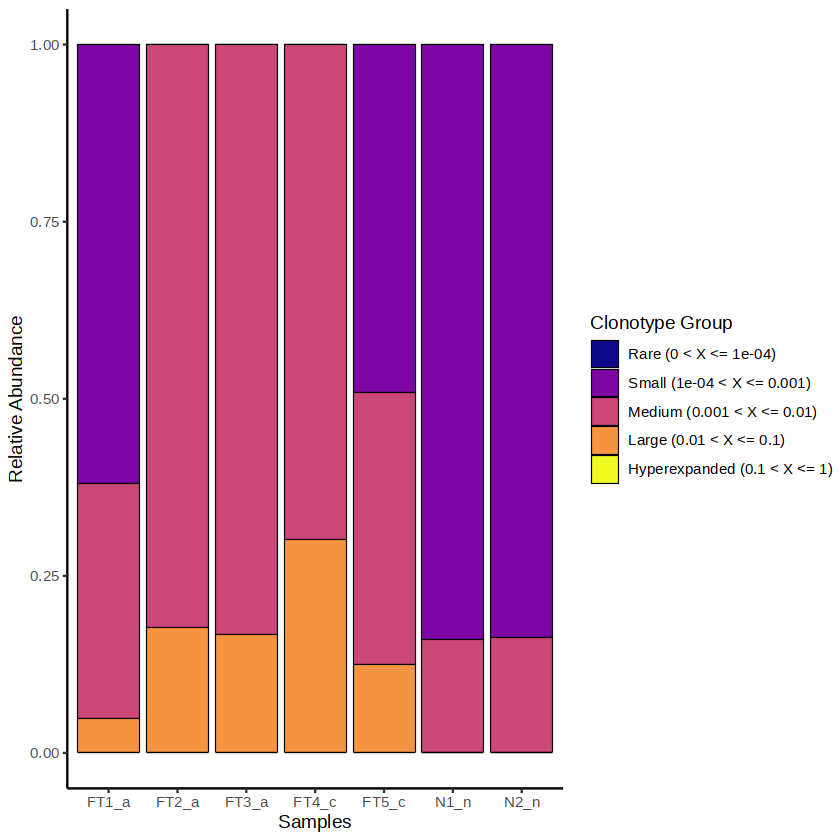

In [23]:
clonalHomeostasis(combined, cloneCall = "gene", 
                  cloneTypes = c(Rare = 1e-04, 
                                 Small = 0.001, 
                                 Medium = 0.01, 
                                 Large = 0.1, 
                                 Hyperexpanded = 1))

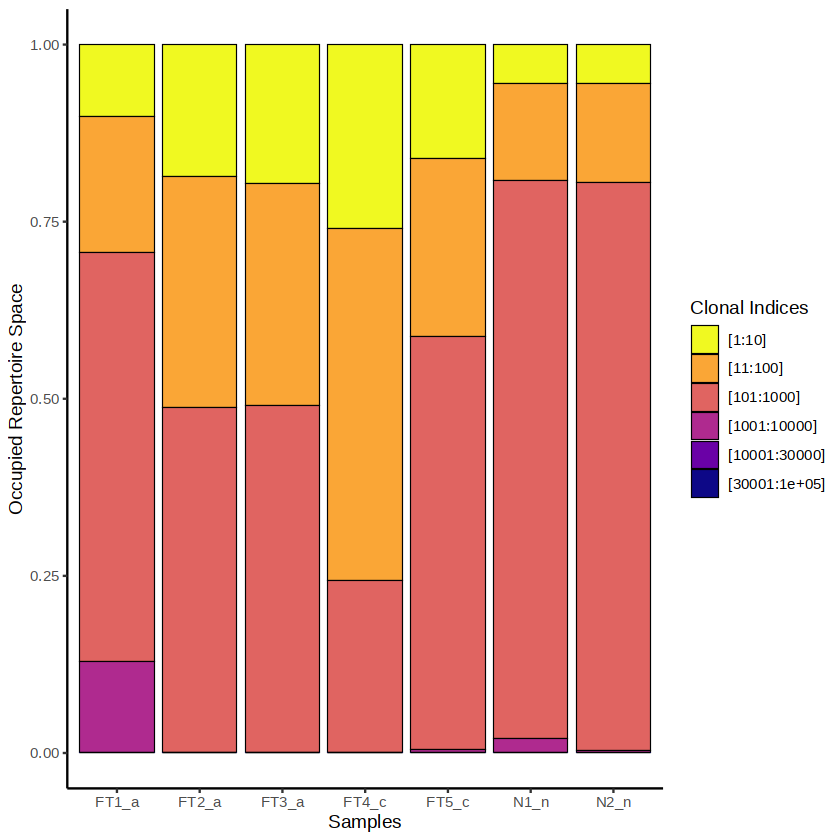

In [24]:
clonalProportion(combined, cloneCall = "gene")

Warning message:
“Removed 21 rows containing missing values (`geom_text()`).”


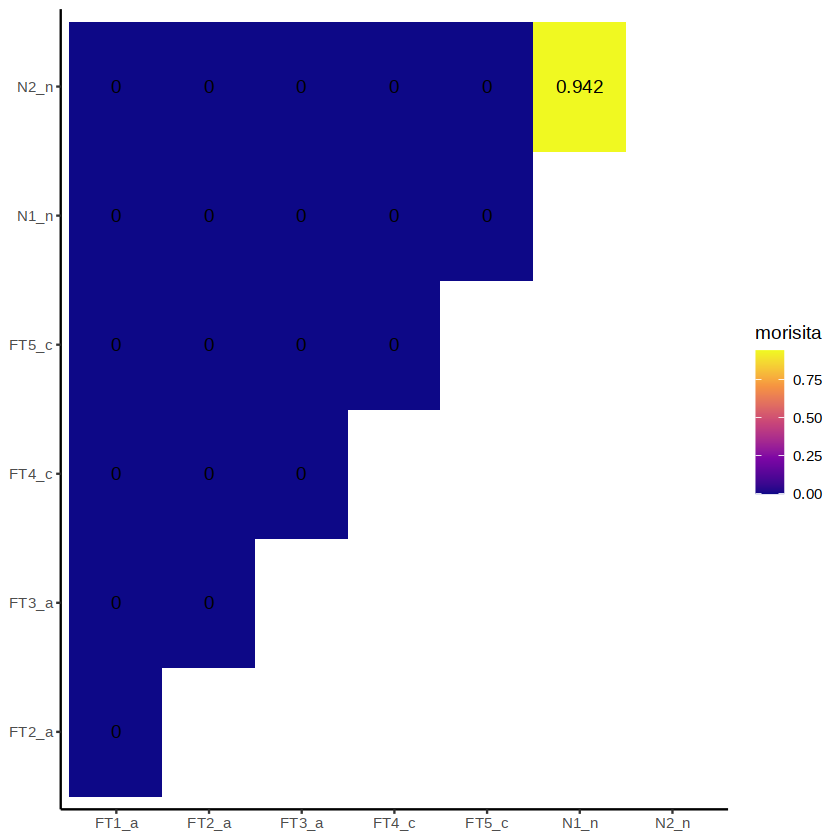

In [30]:
clonalOverlap(combined,
             cloneCall = "strict",
             method = "morisita")
#data("contig_list") 필요

In [63]:
clonesizeDistribution(combined,
                     cloneCall = "gene+nt",
                      chain = "both",
                     method = "ward.D2")

ERROR: Error in gammfit[[bestfit]]: attempt to select less than one element in get1index


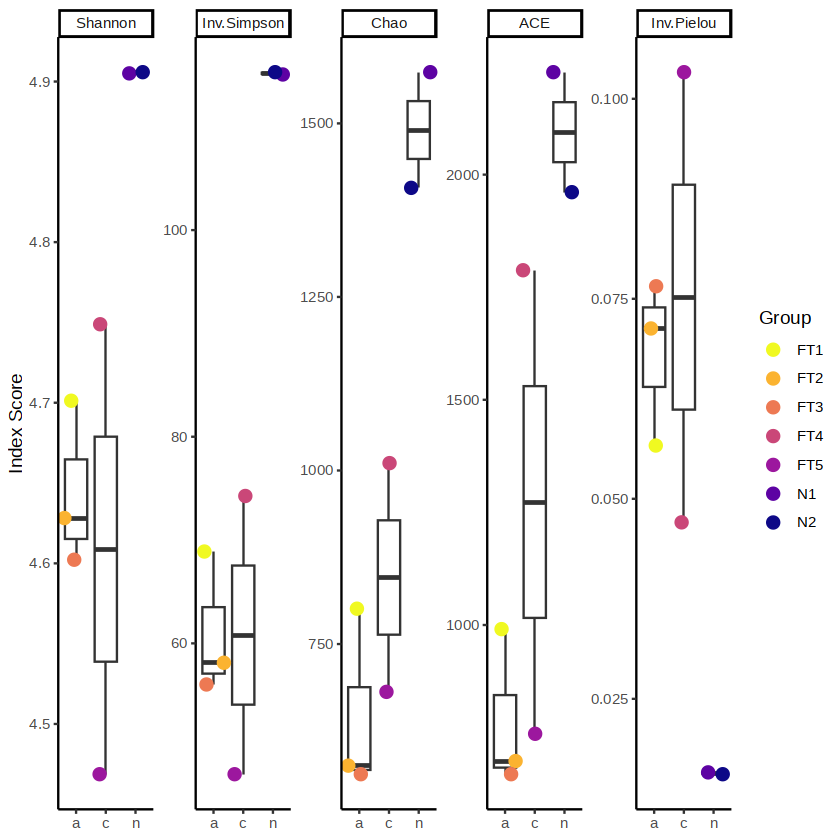

In [62]:
clonalDiversity(combined,
               cloneCall = "gene",
               group.by = "sample",
               x.axis = "ID",
               n.boots = 100)

In [54]:
head(combined$)

barcode,sample,ID,TCR1,cdr3_aa1,cdr3_nt1,TCR2,cdr3_aa2,cdr3_nt2,CTgene,CTnt,CTaa,CTstrict,cellType
<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>
FT1_a_AAACCTGCACCGGAAA-1,FT1,a,TRAV29/DV5.TRAJ44.TRAC,CAAIRYTGTASKLTF,TGTGCAGCAATCCGCTATACCGGCACTGCCAGTAAACTCACCTTT,TRBV24-1.NA.TRBJ1-5.TRBC1,CATSDKYLNQPQHF,TGTGCCACCAGTGATAAATACCTCAATCAGCCCCAGCATTTT,TRAV29/DV5.TRAJ44.TRAC_TRBV24-1.NA.TRBJ1-5.TRBC1,TGTGCAGCAATCCGCTATACCGGCACTGCCAGTAAACTCACCTTT_TGTGCCACCAGTGATAAATACCTCAATCAGCCCCAGCATTTT,CAAIRYTGTASKLTF_CATSDKYLNQPQHF,TRAV29/DV5.TRAJ44.TRAC_TGTGCAGCAATCCGCTATACCGGCACTGCCAGTAAACTCACCTTT_TRBV24-1.NA.TRBJ1-5.TRBC1_TGTGCCACCAGTGATAAATACCTCAATCAGCCCCAGCATTTT,T-AB
FT1_a_AAACCTGGTCTTGTCC-1,FT1,a,TRAV30.TRAJ23.TRAC,CGTEIYNQGGKLIF,TGCGGCACAGAGATCTATAACCAGGGAGGAAAGCTTATCTTC,TRBV12-3.NA.TRBJ1-2.TRBC1,CASSVGPQVGNYGYTF,TGTGCCAGCAGCGTGGGACCCCAGGTCGGGAACTATGGCTACACCTTC,TRAV30.TRAJ23.TRAC_TRBV12-3.NA.TRBJ1-2.TRBC1,TGCGGCACAGAGATCTATAACCAGGGAGGAAAGCTTATCTTC_TGTGCCAGCAGCGTGGGACCCCAGGTCGGGAACTATGGCTACACCTTC,CGTEIYNQGGKLIF_CASSVGPQVGNYGYTF,TRAV30.TRAJ23.TRAC_TGCGGCACAGAGATCTATAACCAGGGAGGAAAGCTTATCTTC_TRBV12-3.NA.TRBJ1-2.TRBC1_TGTGCCAGCAGCGTGGGACCCCAGGTCGGGAACTATGGCTACACCTTC,T-AB
FT1_a_AAACCTGTCTACGAGT-1,FT1,a,TRAV19.TRAJ53.TRAC,CALRRSGGSNYKLTF,TGTGCTCTGAGAAGAAGTGGAGGTAGCAACTATAAACTGACATTT,TRBV29-1.NA.TRBJ2-5.TRBC2,CSVEGGLSSGTQYF,TGCAGCGTTGAAGGGGGCCTGAGTTCCGGGACCCAGTACTTC,TRAV19.TRAJ53.TRAC_TRBV29-1.NA.TRBJ2-5.TRBC2,TGTGCTCTGAGAAGAAGTGGAGGTAGCAACTATAAACTGACATTT_TGCAGCGTTGAAGGGGGCCTGAGTTCCGGGACCCAGTACTTC,CALRRSGGSNYKLTF_CSVEGGLSSGTQYF,TRAV19.TRAJ53.TRAC_TGTGCTCTGAGAAGAAGTGGAGGTAGCAACTATAAACTGACATTT_TRBV29-1.NA.TRBJ2-5.TRBC2_TGCAGCGTTGAAGGGGGCCTGAGTTCCGGGACCCAGTACTTC,T-AB
FT1_a_AAACGGGCAATAAGCA-1,FT1,a,TRAV13-2.TRAJ30.TRAC,CAVSMNRDDKIIF,TGTGCAGTGTCCATGAACAGAGATGACAAGATCATCTTT,TRBV5-1.NA.TRBJ1-4.TRBC1,CASSLAGSTNEKLFF,TGCGCCAGCAGCTTGGCGGGCTCAACTAATGAAAAACTGTTTTTT,TRAV13-2.TRAJ30.TRAC_TRBV5-1.NA.TRBJ1-4.TRBC1,TGTGCAGTGTCCATGAACAGAGATGACAAGATCATCTTT_TGCGCCAGCAGCTTGGCGGGCTCAACTAATGAAAAACTGTTTTTT,CAVSMNRDDKIIF_CASSLAGSTNEKLFF,TRAV13-2.TRAJ30.TRAC_TGTGCAGTGTCCATGAACAGAGATGACAAGATCATCTTT_TRBV5-1.NA.TRBJ1-4.TRBC1_TGCGCCAGCAGCTTGGCGGGCTCAACTAATGAAAAACTGTTTTTT,T-AB
FT1_a_AAACGGGTCGTTGCCT-1,FT1,a,TRAV10.TRAJ26.TRAC,CVVRRDNYGQNFVF,TGTGTGGTGAGGCGGGATAACTATGGTCAGAATTTTGTCTTT,TRBV6-5.NA.TRBJ1-1.TRBC1,CASSYLPSGLAPMNTEAFF,TGTGCCAGCAGTTACCTGCCCAGCGGGCTAGCCCCTATGAACACTGAAGCTTTCTTT,TRAV10.TRAJ26.TRAC_TRBV6-5.NA.TRBJ1-1.TRBC1,TGTGTGGTGAGGCGGGATAACTATGGTCAGAATTTTGTCTTT_TGTGCCAGCAGTTACCTGCCCAGCGGGCTAGCCCCTATGAACACTGAAGCTTTCTTT,CVVRRDNYGQNFVF_CASSYLPSGLAPMNTEAFF,TRAV10.TRAJ26.TRAC_TGTGTGGTGAGGCGGGATAACTATGGTCAGAATTTTGTCTTT_TRBV6-5.NA.TRBJ1-1.TRBC1_TGTGCCAGCAGTTACCTGCCCAGCGGGCTAGCCCCTATGAACACTGAAGCTTTCTTT,T-AB
FT1_a_AAAGATGAGTACACCT-1,FT1,a,TRAV35.TRAJ56.TRAC,CAGQAGANSKLTF,TGTGCTGGGCAGGCTGGAGCCAATAGTAAGCTGACATTT,TRBV20-1.NA.TRBJ2-5.TRBC2,CSARPGNRGKETQYF,TGCAGTGCTAGGCCCGGCAACAGGGGGAAAGAGACCCAGTACTTC,TRAV35.TRAJ56.TRAC_TRBV20-1.NA.TRBJ2-5.TRBC2,TGTGCTGGGCAGGCTGGAGCCAATAGTAAGCTGACATTT_TGCAGTGCTAGGCCCGGCAACAGGGGGAAAGAGACCCAGTACTTC,CAGQAGANSKLTF_CSARPGNRGKETQYF,TRAV35.TRAJ56.TRAC_TGTGCTGGGCAGGCTGGAGCCAATAGTAAGCTGACATTT_TRBV20-1.NA.TRBJ2-5.TRBC2_TGCAGTGCTAGGCCCGGCAACAGGGGGAAAGAGACCCAGTACTTC,T-AB
FT1_a_AAAGATGTCGCCAAAT-1,FT1,a,TRAV21.TRAJ20.TRAC,CAVEPNDYKLSF,TGTGCTGTGGAGCCTAACGACTACAAGCTCAGCTTT,TRBV19.NA.TRBJ2-2.TRBC2,CASSLSGGAYTGELFF,TGTGCCAGTAGTCTTTCAGGGGGCGCATACACCGGGGAGCTGTTTTTT,TRAV21.TRAJ20.TRAC_TRBV19.NA.TRBJ2-2.TRBC2,TGTGCTGTGGAGCCTAACGACTACAAGCTCAGCTTT_TGTGCCAGTAGTCTTTCAGGGGGCGCATACACCGGGGAGCTGTTTTTT,CAVEPNDYKLSF_CASSLSGGAYTGELFF,TRAV21.TRAJ20.TRAC_TGTGCTGTGGAGCCTAACGACTACAAGCTCAGCTTT_TRBV19.NA.TRBJ2-2.TRBC2_TGTGCCAGTAGTCTTTCAGGGGGCGCATACACCGGGGAGCTGTTTTTT,T-AB
FT1_a_AAAGATGTCTCCTATA-1,FT1,a,TRAV8-3.TRAJ41.TRAC,CAVGANSGYALNF,TGTGCTGTGGGTGCGAATTCCGGGTATGCACTCAACTTC,TRBV12-4.NA.TRBJ1-1.TRBC1,CASSFDLVGLVNTEAFF,TGTGCCAGCAGTTTTGATCTCGTGGGGTTGGTTAACACTGAAGCTTTCTTT,TRAV8-3.TRAJ41.TRAC_TRBV12-4.NA.TRBJ1-1.TRBC1,TGTGCTGTGGGTGCGAATTCCGGGTATGCACTCAACTTC_TG

In [60]:
ft1 <- subset(combined$FT1_a)
ft2 <- subset(combined$FT2_a)
ft3 <- subset(combined$FT3_a)
ft5 <- subset(combined$FT5_c)
n1 <- subset(combined$N1_n)
n2 <- subset(combined$N2_n)

In [61]:
write.csv(ft1, file='/home/jurny0402/231116_nor,FTC_seurat/ft1.csv')
write.csv(ft2, file='/home/jurny0402/231116_nor,FTC_seurat/ft2.csv')
write.csv(ft3, file='/home/jurny0402/231116_nor,FTC_seurat/ft3.csv')
write.csv(ft5, file='/home/jurny0402/231116_nor,FTC_seurat/ft5.csv')
write.csv(n1, file='/home/jurny0402/231116_nor,FTC_seurat/n1.csv')
write.csv(n2, file='/home/jurny0402/231116_nor,FTC_seurat/n2.csv')